# PONTIFÍCIA UNIVERSIDADE CATÓLICA DE MINAS GERAIS - NÚCLEO DE EDUCAÇÃO A DISTÂNCIA
# Pós-graduação Lato Sensu em Ciência de Dados e Big Data

# Trabalho de Conclusão de Curso - Turma 2022

-----

Nome:  Thais <br>


Projeto de Machine Learning focado no processamento de linguagem natural. Vamos utilizar algoritmos aprendidos e as técnicas vistas no decorrer do curso para extraírmos informações relevantes de texto. 



## Os Dados

Utilizaremos um Dataset obtido do Twitter com 100K postagens entre os dias 01/08/2018 e 20/10/2018. Cada postagem é classificada como **positiva**, **negativa** ou **neutra**.  

Dois arquivos serão utilizados para o desenvolvimento dos modelos, um para treino/validação e outro para submissão. Os arquivos se encontram na pasta */Dados/train* e */Dados/subm*, respectivamente.

Descrição das colunas:

- **id**: ID único para o tweet  
- **tweet_text**: Texto da publicação no Twitter  
- **tweet_date**: Data da publicação no Twitter  
- **sentiment**: 0 negativo; 1 positivo; 2 neutro  
- **query_used**: Filtro utilizado para buscar a publicação

https://www.kaggle.com/code/leonardoassis/portuguese-tweets-nltk-and-sklearn/input?select=TrainingDatasets

# Desenvolvimento do projeto

## 1. Pré requisitos

### Instalando bibliotecas

In [1]:
%%time

# https://pypi.org/project/pycountry/
# pycountry provides the ISO databases for the standards
!pip install pycountry

# https://pypi.org/project/google-play-scraper/
# Google-Play-Scraper provides APIs to easily crawl the Google Play Store for Python
!pip install google-play-scraper

# https://pypi.org/project/squarify/
!pip install squarify

# https://pypi.org/project/plotly-express/
# Plotly Express is now part of Plotly.py version 4 and so the plotly_express module now just re-exports the contents of plotly.express
!pip install plotly-express

# https://pypi.org/project/mlxtend/
# Mlxtend (machine learning extensions) is a Python library of useful tools for the day-to-day data science tasks.
!pip install mlxtend

# https://pypi.org/project/xgboost/
# XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable.
!pip install xgboost

# https://pypi.org/project/lightgbm/
!pip install lightgbm

# https://pypi.org/project/wordcloud/
# A little word cloud generator in Python.
!pip install wordcloud

# https://pypi.org/project/enelvo/
# A flexible normaliser for user-generated content in Portuguese.
# https://thalesbertaglia.com/enelvo/sobre/
!pip install enelvo

# https://pypi.org/project/spacy/
# spaCy is a library for advanced Natural Language Processing in Python and Cython.
!pip install spacy

# Accuracy
!python -m spacy download pt_core_news_lg

# Efficiency
#!python -m spacy download pt_core_news_sm

# https://pypi.org/project/shap/
# SHAP (SHapley Additive exPlanations) is a game theoretic approach to explain the output of any machine learning model.
!pip install -U shap

#!pip install -U pip setuptools wheel

# Abaixo seguem 2 formas para a instalação: via conda ou pip

# Instalação utilizando conda ex: spacy
#!conda install -c conda-forge spacy

# Instalação utilizando Pip
#!pip install spacy



Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/568.2 MB ? eta -:--:--
     ---------------------------------------- 0.0/568.2 MB ? eta -:--

### Importando bibliotecas

In [2]:
%%time

import json
import pandas as pd
from tqdm import tqdm

import seaborn as sns
import matplotlib.pyplot as plt

from pygments import highlight
from pygments.lexers import JsonLexer
from pygments.formatters import TerminalFormatter

from google_play_scraper import Sort, reviews, app

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)


CPU times: total: 1.14 s
Wall time: 3.77 s


In [3]:
%%time

# Bibliotecas
import os
import re
import string
import random
import time

import pandas as pd
import numpy as np
import datetime
import requests
import warnings
from collections import Counter
from pprint import pprint

from matplotlib.pylab import rcParams
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import squarify
import plotly.offline as py
import plotly_express as px
from plotly import graph_objs as go
import plotly.figure_factory as ff

from sklearn import metrics

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from mlxtend.plotting import plot_confusion_matrix

from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score, f1_score, r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score, StratifiedKFold, cross_validate

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from gensim.models import Word2Vec, doc2vec

# Logistic Regression
from sklearn.linear_model import LogisticRegression 
# Support Vector Machine
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
# Naive Bayes (Gaussian, Multinomial,BernoulliNB)
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
# Stochastic Gradient Descent Classifier
from sklearn.linear_model import SGDClassifier
# KNN (k-nearest neighbor)
from sklearn.neighbors import KNeighborsClassifier
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
# Random Forest
from sklearn.ensemble import RandomForestClassifier
# Gradient Boosting Classifier
from sklearn.ensemble import GradientBoostingClassifier
# XGBoost Classifier
from xgboost import XGBClassifier
# LGBM Classifier
from lightgbm import LGBMClassifier
# Ada Boosting Classifier
from sklearn.ensemble import AdaBoostClassifier
# Dummy Boosting Classifier
from sklearn.dummy import DummyClassifier
# GridSearchCV
from sklearn.model_selection import GridSearchCV
# RidgeClassifier
from sklearn.linear_model import RidgeClassifier

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from unidecode import unidecode

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from enelvo.normaliser import Normaliser

import spacy
from spacy.util import compounding
from spacy.util import minibatch

from tqdm import tqdm

import shap

import imblearn
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

from IPython.core.display import HTML as Center
from IPython.display import Image

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

print('Bibliotecas carregadas com sucesso.')

C:\ProgramData\anaconda3\Lib\site-packages\dask\dataframe\_pyarrow_compat.py:23: UserWarning:

You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.



Bibliotecas carregadas com sucesso.
CPU times: total: 1.69 s
Wall time: 7.3 s


### Padrões

In [4]:
# Definição de padrões para gráficos e cores

sns.set_style('darkgrid') # darkgrid, white grid, dark, white and ticks
plt.rc('axes', titlesize=18)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=13)    # fontsize of the tick labels
plt.rc('ytick', labelsize=13)    # fontsize of the tick labels
plt.rc('legend', fontsize=13)    # legend fontsize
plt.rc('font', size=13)          # controls default text sizes

colors = sns.color_palette("pastel") # deep, pastel, Set1 Set2 Set3, icefire, tab10, muted, colorlind, coolwarm
cmap_colors = 'GnBu'

font_path = "./fonts/CabinSketch-Bold.ttf"

In [5]:
# Definição de padrões para centralização de gráficos no notebook

Center(""" <style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style> """)

### Funções

In [6]:
# Função de avaliação dos valores de NaN no dataframe

def missing_values_table(df):
    '''
    Função para verificar se existem valores nulos no dataframe
    Entrada:
        df - dataframe;
        
    Resultado: 
        Apresentação dos valores nulos no dataframe.

    '''
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mz_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mz_table = mz_table.rename(
    columns = {0 : 'Valores faltantes', 1 : '% de Valores Totais'})
    mz_table['Data Type'] = df.dtypes
    mz_table = mz_table[
        mz_table.iloc[:,1] != 0].sort_values(
    '% de Valores Totais', ascending=False).round(1)
    print ("O dataframe tem " + str(df.shape[1]) + " colunas e " + str(df.shape[0]) + " linhas.\n"      
        "Existem " + str(mz_table.shape[0]) +
          " colunas que têm valores faltantes.")
    #mz_table.to_excel('missing_and_zero_values.xlsx', freeze_panes=(1,0), index = True)
    return mz_table


In [7]:
# Função de avaliação de modelos apresentação da matriz de confusão
score = []

def test_models(model_list, col_model_name, col_model, tec_model, X_train, X_test, y_train, y_test):
    '''
    Função para avaliação de modelos de predição
    Entrada:
        model_list - lista de modelos;
        col_model_name - label da lista de modelos, contendo o nome do modelo;
        col_model - label da lista de modelos, contendo a instancia do modelo de predição;
        tec_model - definição de tratamento de modelos;
        X_train - classe de treino
        X_test - classe de teste
        y_train - classe de treino
        y_test - classe de teste
        
    Resultado: 
        Apresentação de métricas de predição de modelos.

    '''
    for mdl in model_list:
        start = time.time()

        model = mdl[col_model]
        model.fit(X_train, y_train)
        y_predict = model.predict(X_test)
        
        #pipe = make_pipeline(StandardScaler(), model)
        #pipe.fit(X_train, y_train)
        #y_predict = pipe.predict(X_test)
        
        print("")        
        print("=" * 55)
        print("Model      : %s" % mdl[col_model_name])
        print("Accuracy   : %0.4f " % accuracy_score(y_test, y_predict))
        print("Precision  : %0.4f " % precision_score(y_test, y_predict, average='weighted'))
        print("Recall     : %0.4f " % recall_score(y_test, y_predict, average='weighted'))
        print("F1 - Score : %0.4f " % f1_score(y_test, y_predict, average='weighted'))
        print("MAE        : %0.4f " % mean_absolute_error(y_test, y_predict))
        print("RMSE       : %0.4f " % np.sqrt(mean_squared_error(y_test, y_predict)))
        print("R2         : %0.4f " % r2_score(y_test, y_predict))
        print("")
        print(classification_report(y_test, y_predict))

        global score
        score.append([mdl[col_model_name], tec_model, accuracy_score(y_test, y_predict)])
        
        cm = confusion_matrix(y_test, y_predict)
        labels = ['Negativo','Positivo','Neutro']
        dsp = ConfusionMatrixDisplay(cm, display_labels=labels)
        dsp.plot(include_values=True, cmap='Blues', ax=None, xticks_rotation='horizontal')
        plt.grid(False)
        plt.show()        
        
        end = time.time()
        elptime = end - start
        converted_time = str(datetime.timedelta(seconds=elptime))
        print(f'Partial time: {converted_time}')
                

In [8]:
# Função para calcular a importância da variável no modelo

rcParams['figure.figsize'] = 12, 4

def modelfit(alg, dtrain, predictors, target, performCV=True, printFeatureImportance=True, cv_folds=5):
    # Adequando as classes para treino
    alg.fit(dtrain[predictors], dtrain[target])
    
    # Previsão de saída para o conjunto de dados de teste
    dtrain_predictions = alg.predict(dtrain[predictors])
    dtrain_predprob = alg.predict_proba(dtrain[predictors])[:,1]
    
    # Utilizando o Cross Validation
    if performCV:
        cv_score = cross_val_score(alg, dtrain[predictors], dtrain[target], cv=cv_folds, scoring='accuracy')
    
    #Exibindo relatório:
    print (f"\nRelatório do Modelo {alg}")
    print ("\nAcuracia : %.4g" % metrics.accuracy_score(dtrain[target].values, dtrain_predictions))
    #print ("AUC Score (Train): %f" % metrics.roc_auc_score(dtrain[target], dtrain_predprob))
    print ("AUC Score (Train): %f" % metrics.roc_auc_score(dtrain[target], dtrain_predictions))
    
    if performCV:
        print ("CV Score : Mean - %.7g | Std - %.7g | Min - %.7g | Max - %.7g" % (np.mean(cv_score),np.std(cv_score),np.min(cv_score),np.max(cv_score)))


In [9]:

def read_corpus(list_sentences, tokens_only=False):
    if tokens_only:
        # For test data, just return sentences
        return list_sentences
    else:
        # For training data, add tags
        lista = []
        for i, line in enumerate(list_sentences):
            lista.append(doc2vec.TaggedDocument(line, [i]))

        return lista
    

In [10]:
# Função para contagem de palavras 

def words_unique(sentiment, numwords, raw_words):
    '''
    Função para contagem de palavras 
    Entrada:
        segmento - Categoria do segmento (ex. 2 = 'Neutro');
        numwords - quantas palavras específicas se pretende ver no resultado final; 
        raw_words - lista do texto;
        
    Resultado: 
        dataframe com informação sobre a palavra específica e quantas vezes aparece no texto (por ordem decrescente com base nas suas contagens).

    '''
    allother = []
    for item in dfc[dfc.sentiment != sentiment]['list_words']:
        for word in item:
            allother .append(word)
    allother  = list(set(allother ))
    
    specificnonly = [x for x in raw_text if x not in allother]
    
    mycounter = Counter()
    
    for item in dfc[dfc.sentiment == sentiment]['list_words']:
        for word in item:
            mycounter[word] += 1
    keep = list(specificnonly)
    
    for word in list(mycounter):
        if word not in keep:
            del mycounter[word]
    
    Unique_words = pd.DataFrame(mycounter.most_common(numwords), columns = ['words','count'])
    
    return Unique_words


In [11]:
# O spaCy pode identificar as entidades nomeadas como empresas, pessoas, países ou outras coisas que se referem a uma pessoa, local ou 
# coisa específica (por exemplo, Apple, fabricante de computadores, ou maçã, um fruto delicioso e estaladiço).
    
spc_pt = spacy.load('pt_core_news_lg')

nltk.download('stopwords')
nltk.download('punkt')

stopwords = nltk.corpus.stopwords.words('portuguese')
#Adicionando stopwords que não estão na lista do nltk 
stopwords.append("'")
stopwords.append("pra")
stopwords.append("tá")
stopwords.append("tão")


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Johnny\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Johnny\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [12]:
# Função para tratamento da variável de texto para definir melhores valores para classificação da modelagem
# e ou normalizar o tratamento da variável de texto utilizando a biblioteca enelvo

# instanciando
normalizador = Normaliser(tokenizer='readable', sanitize=True, capitalize_acs=True, capitalize_pns=True) # capitalize_inis=True

def nlp_tratar_texto(texto, normalize=False):
    '''
    Função para tratamento de texto 
    Entrada:
        texto - Texto para tratamento;
        normalize - utilizar função de normalização da biblioteca enelvo;
        
    Resultado: 
        Retorna o texto com tratamento de caracteres.

    '''    
    #Remover endereços de sites
    texto_sem_url = re.sub(r'https?:\/\/\S+', '', texto)
        
    #Remover e-mail / users
    #texto_sem_email = re.sub(r'[A-Za-z0-9]*@[A-Za-z]*\.?[A-Za-z0-9]*\.?[A-Za-z0-9]*', '', texto_sem_url)
    texto_sem_email = re.sub(r'[A-Za-z0-9]*@\S+', '', texto_sem_url)
    
    if normalize==True:
        # Tratamento do texto utilizando o enelvo (Normalize)
        texto_norm = normalizador.normalise(texto_sem_email)
    
        #Remover caracteres que não são letras e tokenização
        texto_tratado =  re.findall(r'\b[A-zÀ-úü]+\b', texto_norm.lower())
    else:
        texto_tratado =  re.findall(r'\b[A-zÀ-úü]+\b', texto_sem_email.lower())

    #Remover stopwords
    stop = set(stopwords)
    palavras = [w for w in texto_tratado if w not in stop]
    palavras_string = " ".join(palavras)

    #Instanciar o objeto spacy
    spc_letras =  spc_pt(palavras_string)

    #Lemmização 
    tokens = [token.lemma_ if token.pos_ == 'VERB' else str(token) for token in spc_letras]

    #problemas com verbo ir
    ir = ['vou', 'vais', 'vai', 'vamos', 'ides', 'vão']
    tokens = ['ir' if token in ir else str(token) for token in tokens]
    
    return tokens

In [13]:
# Função para apresentar nuvem de palavras

def plot_wordcloud(text, title = None, backcolor = 'white', clrmap = ''):
    '''
    Função para criação de imagem de nuvem de palavras
    Entrada:
        text - palavras para nuvem de palavras;
        title - título da imagem;
        backcolor - ;
        clrmap - ;
        
    Resultado: 
        Imagem com nuvem de palavras.

    '''    
    wordcloud = WordCloud(
                            background_color=backcolor,
                            width=2000, 
                            height=800,
                            colormap=clrmap, 
                            font_path=font_path, 
                            collocations = False)

    wordcloud.generate(text)
    
    fig = plt.figure(figsize=(12,10))

    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()


In [14]:
# Função para diminuir o tamanho do dataframe com alteração dos datatypes

def reduce_mem_usage(df, verbose=True):
    '''
    Função para diminuir o tamanho do dataframe com alteração dos datatypes
    Entrada:
        df - dataframe;
        
    Resultado: 
        Retorna o dataframe com alteração com a configuração mínimas dos tipos do datatype;
        
    '''
    numerics = ['int8','int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

## 1. Análise de consistência dos dados

### Inicializando Dataframe

#### Arquivo Train3Classes.csv

In [15]:
# Importando arquivo

df = reduce_mem_usage(pd.read_csv('./dados/train/Train3Classes.csv'))


Mem. usage decreased to  2.99 Mb (17.5% reduction)


In [16]:
# Quantidade de linhas e colunas

qtl, qtc = df.shape

# Quantidade de linhas duplicadas

qtd, _ = df[df.duplicated(keep=False)].shape

print(f'Quantidade de linhas...........: {qtl}')
print(f'Quantidade de linhas duplicadas: {qtd}')
print(f'Quantidade de colunas..........: {qtc}')


Quantidade de linhas...........: 95000
Quantidade de linhas duplicadas: 0
Quantidade de colunas..........: 5


In [17]:
# Informações do dataframe

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95000 entries, 0 to 94999
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          95000 non-null  int64 
 1   tweet_text  95000 non-null  object
 2   tweet_date  95000 non-null  object
 3   sentiment   95000 non-null  int8  
 4   query_used  95000 non-null  object
dtypes: int64(1), int8(1), object(3)
memory usage: 3.0+ MB


In [18]:
# Avaliando os valores nulos do dataframe

missing_values_table(df)


O dataframe tem 5 colunas e 95000 linhas.
Existem 0 colunas que têm valores faltantes.


,Valores faltantes,% de Valores Totais,Data Type



---

**Conclusões:** 

O dataframe é composto por 05 colunas e 95.000 registros.

A tabela acima NÃO apresenta valores faltantes.



In [19]:
# Lista de colunas do dataframe

df.columns


Index(['id', 'tweet_text', 'tweet_date', 'sentiment', 'query_used'], dtype='object')

In [20]:
# Listagem das primeiras linhas do dataframe

df.head()


,id,tweet_text,tweet_date,sentiment,query_used
0,1049721159292346368,Rio elege maior bancada policial de sua histór...,Tue Oct 09 18:00:01 +0000 2018,2,folha
1,1046251157025423360,fiquei tão triste quando eu vi o preço da câme...,Sun Sep 30 04:11:28 +0000 2018,0,:(
2,1041744620206653440,"Para Theresa May, seu plano para o Brexit é a ...",Mon Sep 17 17:44:06 +0000 2018,2,exame
3,1046937084727107589,caralho eu quero proteger a danielly em um pot...,Tue Oct 02 01:37:06 +0000 2018,0,:(
4,1047326854229778432,@SiCaetano_ viva o caos :),Wed Oct 03 03:25:55 +0000 2018,1,:)


#### Arquivo Subm3Classes.csv

In [21]:
# Importando arquivo

dfs = reduce_mem_usage(pd.read_csv('./dados/subm/Subm3Classes.csv'))


Mem. usage decreased to  0.15 Mb (0.0% reduction)


In [22]:
# Quantidade de linhas e colunas

sqtl, sqtc = dfs.shape

# Quantidade de linhas duplicadas

sqtd, _ = dfs[dfs.duplicated(keep=False)].shape

print(f'Quantidade de linhas...........: {sqtl}')
print(f'Quantidade de linhas duplicadas: {sqtd}')
print(f'Quantidade de colunas..........: {sqtc}')


Quantidade de linhas...........: 5000
Quantidade de linhas duplicadas: 0
Quantidade de colunas..........: 4


In [23]:
# Informações do dataframe

dfs.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          5000 non-null   int64 
 1   tweet_text  5000 non-null   object
 2   tweet_date  5000 non-null   object
 3   query_used  5000 non-null   object
dtypes: int64(1), object(3)
memory usage: 156.4+ KB


In [24]:
# Avaliando os valores nulos do dataframe

missing_values_table(dfs)


O dataframe tem 4 colunas e 5000 linhas.
Existem 0 colunas que têm valores faltantes.


,Valores faltantes,% de Valores Totais,Data Type



---

**Conclusões:** 

O dataframe é composto por 04 colunas e 5.000 registros.

A tabela acima NÃO apresenta valores faltantes.



In [25]:
# Lista de colunas do dataframe

dfs.columns


Index(['id', 'tweet_text', 'tweet_date', 'query_used'], dtype='object')

In [26]:
# Listagem das primeiras linhas do dataframe

dfs.head()


,id,tweet_text,tweet_date,query_used
0,1046764676707753987,Apartamento Vila Mariana Praça Monteiro dos Sa...,Mon Oct 01 14:12:01 +0000 2018,:)
1,1047329264943751169,@FalleNCS @BrasilGameShow quero 1x1 de scout. ...,Wed Oct 03 03:35:29 +0000 2018,:)
2,1045443874947313665,mais uma analógica no correio à minha espera :...,Thu Sep 27 22:43:37 +0000 2018,:)
3,1040484298711814144,"Em festa de posse como presidente do STF, Toff...",Fri Sep 14 06:16:02 +0000 2018,folha
4,1045411876887306240,@thethiagor @jubsilva @GSCISA @GrupoMulheRIs A...,Thu Sep 27 20:36:28 +0000 2018,:)


## 2. Pré-processamento e transformações


---

**Tratamento de variáveis**

- Criação da variável **filtered_words**, onde o texto original (tweet_text) será submetido a tratamentos de texto;<br>


- Criação da variável **join_f_words**, para concatenar as palavras do coluna **filtered_words**;<br>


- Criação da variável **num_words_text**, para contar a quantidade de palavras no texto principal;<br>


- Criação da variável **num_words_join**, para contar a quantidade de palavrvas após tratamento;<br>


- Criação da variável **diff_in_words**, para contar a diferença de palavras entre o texto principal e o tratado;<br>


- Exclusão de variáveis que entendemos não ser relevante para o modelo<br>
    **id**: ID único para o tweet<br>
    **tweet_date**: Data da publicação no Twitter<br>
    **filtered_words**: Variável auxiliar para tratamento de texto<br>


In [27]:
%%time

# ENELVO = é um normalizador textual flexível de conteúdo gerado por usuário para o português brasileiro.
# Parametro para utilizar o enelvo.normalise (1=sim / 0=Não)
# IMPORTANTE: o processo da biblioteca enelvo eleva o tempo de processamento do notebook em 2 horas

# use_normalize = 1
# O processamento desta célula com o tratamendo dos tweets utilizando o biblioteca enelvo leva em média 2 horas, 
# em uma máquina i7 com 12 cores e 32 ram 

# use_normalize = 0
# O processamento desta célula com o tratamendo dos tweets leva em média 10 min, em uma máquina i7 com 12 cores e 32 ram 

use_normalize = 1

# Verifica se utiliza o tratamento com Enelvo
if use_normalize==1:
    # Cria uma nova variável utilizando funções para tratamento das palavras do texto
    df['filtered_words'] = df['tweet_text'].apply(lambda w: nlp_tratar_texto(w, normalize=True))
    dfs['filtered_words'] = dfs['tweet_text'].apply(lambda w: nlp_tratar_texto(w, normalize=True))
else:
    # Cria uma nova variável utilizando funções para tratamento das palavras do texto
    df['filtered_words'] = df['tweet_text'].apply(lambda w: nlp_tratar_texto(w))
    dfs['filtered_words'] = dfs['tweet_text'].apply(lambda w: nlp_tratar_texto(w))

# Cria uma nova variável concatenando os tokens gerados pelo tratamento das palavras gerando um novo texto reduzido
df['join_f_words'] = df['filtered_words'].apply(lambda w: ' '.join(w))
dfs['join_f_words'] = dfs['filtered_words'].apply(lambda w: ' '.join(w))

# Cria uma nova variável com a quantidade de palavras da variável join_f_words
df['num_words_text'] = df['tweet_text'].apply(lambda w:len(str(w).split()))
dfs['num_words_text'] = dfs['tweet_text'].apply(lambda w:len(str(w).split()))

# Cria uma nova variável com a quantidade de palavras da variável join_f_words
df['num_words_join'] = df['join_f_words'].apply(lambda w:len(str(w).split()))
dfs['num_words_join'] = dfs['join_f_words'].apply(lambda w:len(str(w).split()))

# Cria uma nova variável com a diferença de quantidade de palavras
df['diff_in_words'] = df['num_words_text'] - df['num_words_join']
dfs['diff_in_words'] = dfs['num_words_text'] - dfs['num_words_join']


CPU times: total: 2h 13min 25s
Wall time: 2h 21min 11s


In [28]:
# Altera o tamanho da visualização das colunas para demonstrar todo o conteúdo
pd.set_option("display.max_colwidth", 0)

# Mostra o conteúdo das variáveis tratadas
df[['tweet_text', 'filtered_words', 'join_f_words']]


,tweet_text,filtered_words,join_f_words
0,Rio elege maior bancada policial de sua história https://t.co/sGXnhZKrHx https://t.co/Mcgiz70jPF,"[rio, eleger, maior, bancada, policial, história]",rio eleger maior bancada policial história
1,fiquei tão triste quando eu vi o preço da câmera :((((,"[fiquei, triste, ver, preço, câmerar]",fiquei triste ver preço câmerar
2,"Para Theresa May, seu plano para o Brexit é a única opção https://t.co/epl39YD9bj","[teresa, may, plano, brecht, única, opção]",teresa may plano brecht única opção
3,caralho eu quero proteger a danielly em um pote tadinhaa :(,"[caralho, querer, proteger, daniel, pote, tadir]",caralho querer proteger daniel pote tadir
4,@SiCaetano_ viva o caos :),"[viva, caos]",viva caos
...,...,...,...
94995,"Cuba e defensor de direitos humanos se unem contra chefe da OEA, intervenção militar na Venezuela. https://t.co/Lo2RvIgFBA https://t.co/CiPddCuRvw","[cuba, defensor, direitos, humanos, uner, contra, chefe, rússia, intervenção, militar, venezuela]",cuba defensor direitos humanos uner contra chefe rússia intervenção militar venezuela
94996,"#Oportunidade ➡️ Venha fazer parte da nossa equipe! Vagas abertas para alunos de Administração. Envie seu currículo e comprovante de matrícula para análise prévia até às 12h do dia 24/08, para o e-mail: vagasestagio@sistemafieto.com.br 😉 https://t.co/qvdFYeJh9I","[oportunidade, vir, fazer, parte, equipe, vagas, abertas, alunos, administração, enviar, currículo, comprovante, matrícula, análise, prévia, dia, email]",oportunidade vir fazer parte equipe vagas abertas alunos administração enviar currículo comprovante matrícula análise prévia dia email
94997,"@96syoo EU SEI 😭😭 é por isso que significa muito!! To feliz demais, eu amo ela :( e aqui da pra ver que ela deixa a bandeira na frente do palco e sai correndo pra pegar garrafa de água mas depois disso ela pegou de novo 😂 https://t.co/82oPAXYVNC","[saber, significar, to, feliz, demais, amer, aqui, ver, deixar, bandeira, frente, palco, sair, correr, pegar, garrafa, água, disso, pegar, novo]",saber significar to feliz demais amer aqui ver deixar bandeira frente palco sair correr pegar garrafa água disso pegar novo
94998,@louistsexhes N te conheço mas posta :D,"[conhecer, pôr, d]",conhecer pôr d



---

**Conclusões**

A variável tweet_text foi exposta aos tratamentos de texto da função nlp_tratar_texto:

- Remoção de endereços de sites;
- Remoção de e-mails e usuários do tweet;
- Remoção de caracteres que não são letras;
- Remoção de dígitos;
- Transformação de todas as palavras para minúsculas;
- Tokenização do texto;
- Remoção de stopwords (portugues);
- "Lemmatização" do texto;
- **enelvo.normalise** "corrige" abreviações, gírias, erros ortográficos e acrônimos;

Após o tratamento do texto foi criada a variável **join_f_words** para gravar as informações do texto tratado, entendo que esta variável esteja mais "limpa" para utilização do texto.


In [29]:
# Exclusão de variáveis que entendemos não ser relevante para o modelo

# id: ID único para o tweet  
# tweet_date: Data da publicação no Twitter  
# query_used: Filtro utilizado para buscar a publicação
# filtered_words: Texto da publicação no Twitter após tratamento de texto

# Excluindo colunas
DeleteList=['id', 'tweet_date', 'filtered_words']

# Novo dataframe dfc (df copy)
dfc = df.drop(DeleteList, axis=1).copy()


In [30]:
# Informações do dataframe

dfc.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95000 entries, 0 to 94999
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_text      95000 non-null  object
 1   sentiment       95000 non-null  int8  
 2   query_used      95000 non-null  object
 3   join_f_words    95000 non-null  object
 4   num_words_text  95000 non-null  int64 
 5   num_words_join  95000 non-null  int64 
 6   diff_in_words   95000 non-null  int64 
dtypes: int64(3), int8(1), object(3)
memory usage: 4.4+ MB


In [31]:
# Verificando quais linhas não apresentam valor após o tratamento do texto

# Quantidade de linhas vazias
qtd, _ = dfc[np.where((dfc['join_f_words'].str.len()<1), True, False)].shape

print('Dataframe original - df')
print(f'Quantidade de linhas vazias ...: {qtd}')


Dataframe original - df
Quantidade de linhas vazias ...: 514


In [32]:
# Retirando as linhas que ficaram sem texto

dfc = dfc[np.where((dfc['join_f_words'].str.len()>1), True, False)].copy()


In [33]:
# Avaliando os valores nulos do dataframe

missing_values_table(dfc)


O dataframe tem 7 colunas e 94456 linhas.
Existem 0 colunas que têm valores faltantes.


,Valores faltantes,% de Valores Totais,Data Type



---

**Conclusões:** 

A tabela acima NÃO apresenta valores faltantes.


In [34]:
# Exclusão dos registros faltantes 

dfc.dropna() 
dfc.reset_index(drop=True, inplace=True)


In [35]:
# Quantidade de linhas e colunas

qtlc, qtcc = dfc.shape

# Quantidade de linhas duplicadas
qtd, _ = dfc[dfc.duplicated()].shape


print('Dataframe original - df')
print(f'Quantidade de linhas...........: {qtl}')
print(f'Quantidade de colunas..........: {qtc}')

print('\nDataframe tratado - dfc')
print(f'Quantidade de linhas...........: {qtlc}')
print(f'Quantidade de linhas duplicadas: {qtd}')
print(f'Quantidade de colunas..........: {qtcc}')

print (f'\nPercentual de registros retirados: {(100  * (qtl-qtlc) / qtl):.2f}%')


Dataframe original - df
Quantidade de linhas...........: 95000
Quantidade de colunas..........: 5

Dataframe tratado - dfc
Quantidade de linhas...........: 94456
Quantidade de linhas duplicadas: 799
Quantidade de colunas..........: 7

Percentual de registros retirados: 0.57%


In [36]:
# Verificando linhas duplicadas

# Seleciona as linhas duplicadas no dataframe baseado em todas as colunas
display(dfc[dfc.duplicated(keep='first')].sort_values(by=list(dfc.columns)))

print("\nLinhas duplicadas:")
print(dfc[dfc.duplicated()].shape[0])


,tweet_text,sentiment,query_used,join_f_words,num_words_text,num_words_join,diff_in_words
73895,"""Em recuperação judicial, Eternit vê receita crescer em agosto"" https://t.co/aKl26jNJyJ #trabalho #feedly",2,#trabalho,recuperação judicial eternit ver receita crescer agosto trabalho feedly,12,9,3
36368,"#CulturalSpam serale... #notizie #curiose, #interessanti, talvolta #utili! :D #curious, #interesting, sometimes #useful #news! :D Des #nouvelles #curieuses, #intéressantes, parfois #utiles! https://t.co/MjC5j2svqe :D",1,:),culturalspam serial notizie curiose interessanti malévola utili d curious interesting sometimes useful news d dês nouvelles curieuses intéressantes garfos utiles d,22,21,1
66438,#FollowFriday Todos os meus seguidores. :) #ff,1,:),followfriday todos seguidores ff,7,4,3
30124,#FollowFriday para todos meus queridos seguidores. :) #IFTTT,1,:),followfriday todos querido seguidores ifttt,8,5,3
24754,"#Novidade Novo Kindle Oasis, tela de 7” sensível ao toque de alta resolução, à prova d’água, iluminação embutida, Wi-Fi https://t.co/kLVZK6xkBp Confira o preço no site. #kindle #amazon #leitor #ebook #KindleUnlimited #kindledeals #kindlebook",2,#novidade,novidade novo kindle oasis tela sensível toque alta resolução provar água iluminação embutir wifi confira preço site kindle amazon leitor ebook Kindleunlimited kindledeals kindlebook,32,24,8
...,...,...,...,...,...,...,...
39018,tédio :(,0,:(,tédio,2,1,1
55254,us2 q uminom :(((,0,:(,rumino,4,1,3
39102,voltei :),1,:),voltar,2,1,1
88688,vou tentar dormir :(,0,:(,ir tentar dormir,4,3,1



Linhas duplicadas:
799


---

**Conclusões:** 

Após tratamento do texto identifiquei duplicidades de informações, como a quantidade é baixa optei em retirar as linhas repetidas.


In [37]:

# Excluindo os linhas duplicadas
dfc = dfc.drop_duplicates(keep='first').copy()
dfc.reset_index(drop=True, inplace=True)


In [38]:
# Quantidade de linhas e colunas

qtlc, qtcc = dfc.shape

# Quantidade de linhas duplicadas
qtd, _ = dfc[dfc.duplicated()].shape


print('Dataframe original - df')
print(f'Quantidade de linhas...........: {qtl}')
print(f'Quantidade de colunas..........: {qtc}')

print('\nDataframe tratado - dfc')
print(f'Quantidade de linhas...........: {qtlc}')
print(f'Quantidade de linhas duplicadas: {qtd}')
print(f'Quantidade de colunas..........: {qtcc}')

print (f'\nPercentual de registros retirados: {(100  * (qtl-qtlc) / qtl):.2f}%')


Dataframe original - df
Quantidade de linhas...........: 95000
Quantidade de colunas..........: 5

Dataframe tratado - dfc
Quantidade de linhas...........: 93657
Quantidade de linhas duplicadas: 0
Quantidade de colunas..........: 7

Percentual de registros retirados: 1.41%


In [39]:
# Grava um novo CSV com as variáveis auxiliares

# Definindo o nome do arquivo
if use_normalize==1:
    file_name = './dados/train/Train3Classes_with_Token_normalize.csv'
    file_name_s = './dados/subm/Subm3Classes_with_Token_normalize.csv'
else:
    file_name = './dados/train/Train3Classes_with_Token.csv'
    file_name_s = './dados/subm/Subm3Classes_with_Token.csv'

# Salvando o CSV
try:
    # Gravando o dataframe em CSV
    dfc.to_csv(file_name, index=False)
    dfs.to_csv(file_name_s, index=False)
    print(f'DataFrame gravado com successo.\n')
    
    try:
        # Carregar o dataframe
        dfc = reduce_mem_usage(pd.read_csv(file_name))
        dfs = reduce_mem_usage(pd.read_csv(file_name_s))
        print(f'Arquivo carregado com successo.')

    except:
        print(f'Ocorreu um erro no carregamento do arquivo.')
    
except:
    print("Ocorreu um erro na gravação.")


DataFrame gravado com successo.

Mem. usage decreased to  2.50 Mb (50.0% reduction)
Mem. usage decreased to  0.24 Mb (29.2% reduction)
Arquivo carregado com successo.


---

**Conclusões:** 

- Tratei a variável **tweet_text** para criar a variável auxiliar **filtered_words**, onde os textos foram submetidos a tratamentos para definir as palavras chaves de sentimento, utilizando também a biblioteca **enelvo**;<br>


- Criei a variável **join_f_words**, para concatenar as palavras do coluna **filtered_words**;<br>


- Criei um novo dataframe **dfc**, retirando as variáveis **id, tweet_date, filtered_words**, pois acredito que as variáveis não são relevantes para a modelagem;<br>


- Retirei todos os registros que apresentavam colunas nulas;<br>


- Retirei todos os registros que estavam duplicados;<br>


Com esses processos acredito que o novo dataframe esta melhor preparado para análise exploratória de dados e modelagem.


## 3. Análise exploratória

In [40]:
# Informações do dataframe

dfc.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93657 entries, 0 to 93656
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_text      93657 non-null  object
 1   sentiment       93657 non-null  int8  
 2   query_used      93657 non-null  object
 3   join_f_words    93657 non-null  object
 4   num_words_text  93657 non-null  int8  
 5   num_words_join  93657 non-null  int8  
 6   diff_in_words   93657 non-null  int8  
dtypes: int8(4), object(3)
memory usage: 2.5+ MB


In [41]:
# Listagem das primeiras linhas do dataframe

dfc.head()


,tweet_text,sentiment,query_used,join_f_words,num_words_text,num_words_join,diff_in_words
0,Rio elege maior bancada policial de sua história https://t.co/sGXnhZKrHx https://t.co/Mcgiz70jPF,2,folha,rio eleger maior bancada policial história,10,6,4
1,fiquei tão triste quando eu vi o preço da câmera :((((,0,:(,fiquei triste ver preço câmerar,11,5,6
2,"Para Theresa May, seu plano para o Brexit é a única opção https://t.co/epl39YD9bj",2,exame,teresa may plano brecht única opção,13,6,7
3,caralho eu quero proteger a danielly em um pote tadinhaa :(,0,:(,caralho querer proteger daniel pote tadir,11,6,5
4,@SiCaetano_ viva o caos :),1,:),viva caos,5,2,3


### Analisando Sentimentos

#### sentiment

- 0, se negativo; 
- 1, se positivo; 
- 2, se neutro

In [42]:
# Quantidade de sentimentos

Counter(dfc['sentiment']).most_common()


[(2, 31422), (0, 31127), (1, 31108)]

In [43]:
# Distribuição de tweets

temp = dfc.groupby('sentiment').count()['tweet_text'].reset_index().sort_values(by='tweet_text',ascending=False)
temp


,sentiment,tweet_text
2,2,31422
0,0,31127
1,1,31108


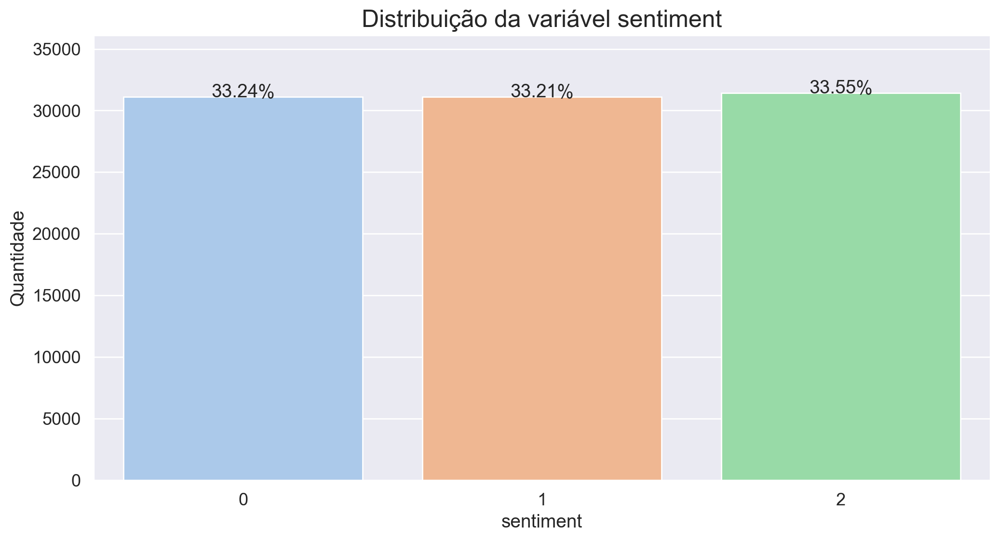

In [44]:
# Distribuição da variavel sentiment

col = 'sentiment'

total = len(dfc)

plt.figure(figsize=(12,6))
g = sns.countplot(x=col, data=dfc, palette=colors)
g.set_title(f"Distribuição da variável {col}")
g.set_xlabel(f"{col}")
g.set_ylabel("Quantidade")
sizes=[]
for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format((height/total)*100),
            ha="center", fontsize=14) 
g.set_ylim(0, max(sizes) * 1.15)
plt.show()


---

**Conclusões:** 

Analisando a variável **sentiment** podemos constatar que o nosso dataframe contém quantidades de tweets balanceados, diminuindo a tendência do modelo para algum dos sentimentos.


#### query_used

- :(, se negativo (0);
- :), se positivo (1);
- "outros", se neutro (2)


In [89]:
# Quantidade de sentimentos

Counter(dfc['query_used']).most_common()


[(':(', 31127),
 (':)', 31108),
 ('folha', 4989),
 ('estadao', 3880),
 ('#fato', 3444),
 ('g1', 3434),
 ('exame', 3416),
 ('#trabalho', 3027),
 ('jornaloglobo', 2374),
 ('#oportunidade', 2350),
 ('veja', 2098),
 ('#noticia', 1113),
 ('#novidade', 916),
 ('#curiosidade', 381)]

In [46]:
# Avaliação da variável query_used

# Criação de nova variável substituindo os valores "outros" por :|, ou seja, diferente de ":(" e ":)" para 
# agrupar os sentimentos neutros

conditions = [
    (dfc['query_used'] != ':(') & (dfc['query_used'] != ':)'),
    (dfc['query_used'] == ':('),
    (dfc['query_used'] == ':)')]
choices = [':|', ':(', ':)']
dfc['sent_query_used'] = np.select(conditions, choices, default=np.NaN)


In [47]:
# Distribuição de tweets

temp_q = dfc.groupby('sent_query_used').count()['tweet_text'].reset_index().sort_values(by='tweet_text',ascending=False)
temp_q

temp_q.rename(columns = {'tweet_text':'tweet_text_q'}, inplace = True)


In [48]:
# Concatenando os dataframes auxiliares para avaliar a quantidade de sentimentos e query_used

df_col = pd.concat([temp_q, temp], axis=1)
df_col


,sent_query_used,tweet_text_q,sentiment,tweet_text
2,:|,31422,2,31422
0,:(,31127,0,31127
1,:),31108,1,31108


### Analisando as palavras dos textos

In [49]:
# Criando a lista de palavras e o vocabulário de palavras

dfc['list_words'] = dfc['join_f_words'].apply(lambda w:str(w).split())

# Criando vocabulário (collection) para armazenar as palavras e vezes que aparecem
top = Counter([item for sublist in dfc['list_words'] for item in sublist])

print(f"O vocabulário é formado por {len(top)} palavras!")


O vocabulário é formado por 45191 palavras!


In [50]:
# As 20 Palavras mais utilizadas nos textos

temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Palavras','Quantidade']
temp.style.background_gradient(cmap=cmap_colors)


,Palavras,Quantidade
0,ir,10986
1,querer,6702
2,fazer,5939
3,ver,5813
4,dizer,4299
5,trabalho,4034
6,dia,3906
7,saber,3807
8,poder,3771
9,d,3742


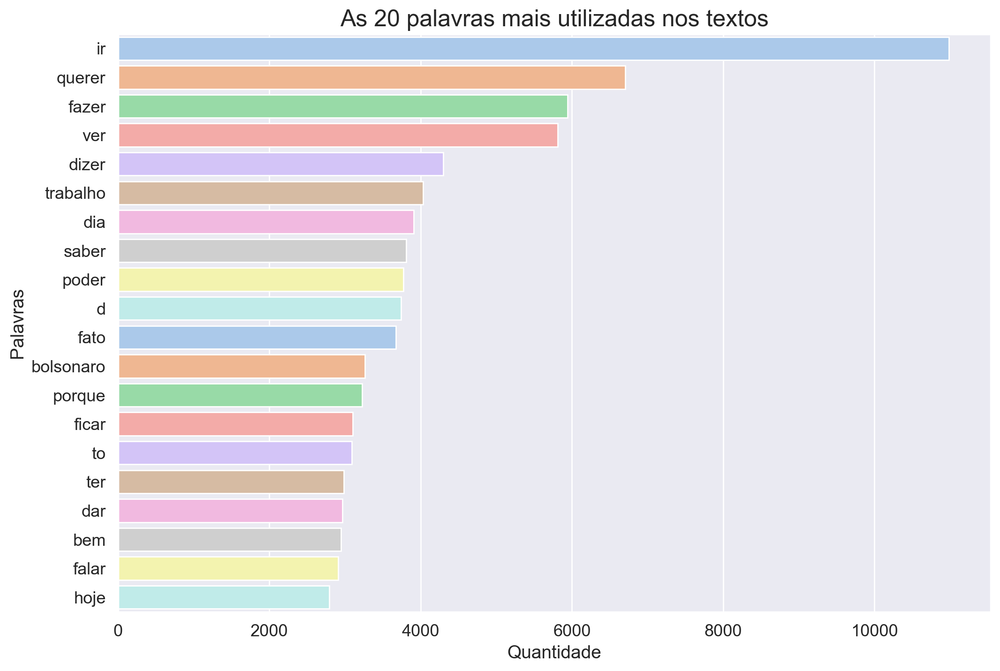

In [51]:
# Analisando a quantidade de palavras mais utilizadas

plt.figure(figsize=(12,8))

g = sns.barplot(x='Quantidade', y='Palavras', data=temp, palette=colors)
g.set_title(f"As 20 palavras mais utilizadas nos textos")
g.set_xlabel(f"Quantidade")
g.set_ylabel("Palavras")
plt.show()


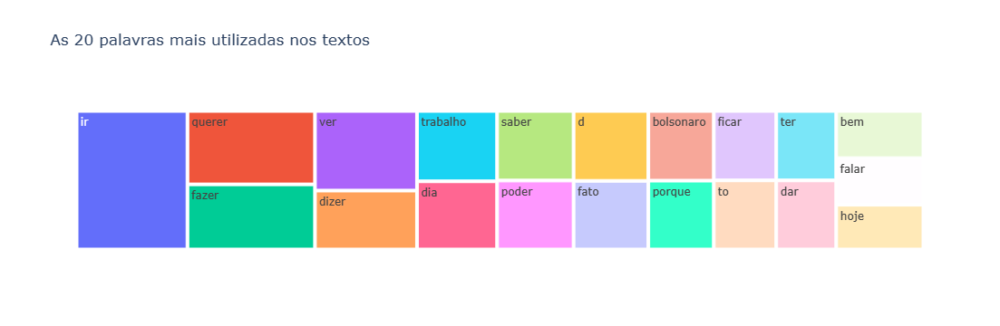

In [52]:
# Analisando a quantidade de palavras mais utilizadas

fig = px.treemap(temp, path=['Palavras'], values='Quantidade',title='As 20 palavras mais utilizadas nos textos')
fig.show()


### Palavras mais utilizadas por Sentimento

In [53]:
# Criando dataframes por sentimentos

# negativo
Negative_sent = dfc[dfc['sentiment']==0]
Negative_sent.reset_index(drop=True, inplace=True)

# positivo
Positive_sent = dfc[dfc['sentiment']==1]
Positive_sent.reset_index(drop=True, inplace=True)

# neutro
Neutral_sent = dfc[dfc['sentiment']==2]
Neutral_sent.reset_index(drop=True, inplace=True)


In [54]:
# Lista auxiliar com todas as palavras do dataframe

raw_text = [word for word_list in dfc['list_words'] for word in word_list]


#### Sentimentos Negativos

In [55]:
# Palavras mais utilizadas em sentimentos negativos

top = Counter([item for sublist in Negative_sent['list_words'] for item in sublist])
temp_negative = pd.DataFrame(top.most_common(20))
temp_negative = temp_negative.iloc[1:,:]
temp_negative.columns = ['Palavras','Quantidade']
temp_negative.style.background_gradient(cmap='Reds')


,Palavras,Quantidade
1,querer,4128
2,to,2206
3,fazer,1894
4,ver,1820
5,triste,1793
6,porque,1639
7,saber,1583
8,ficar,1435
9,ter,1366
10,gente,1267


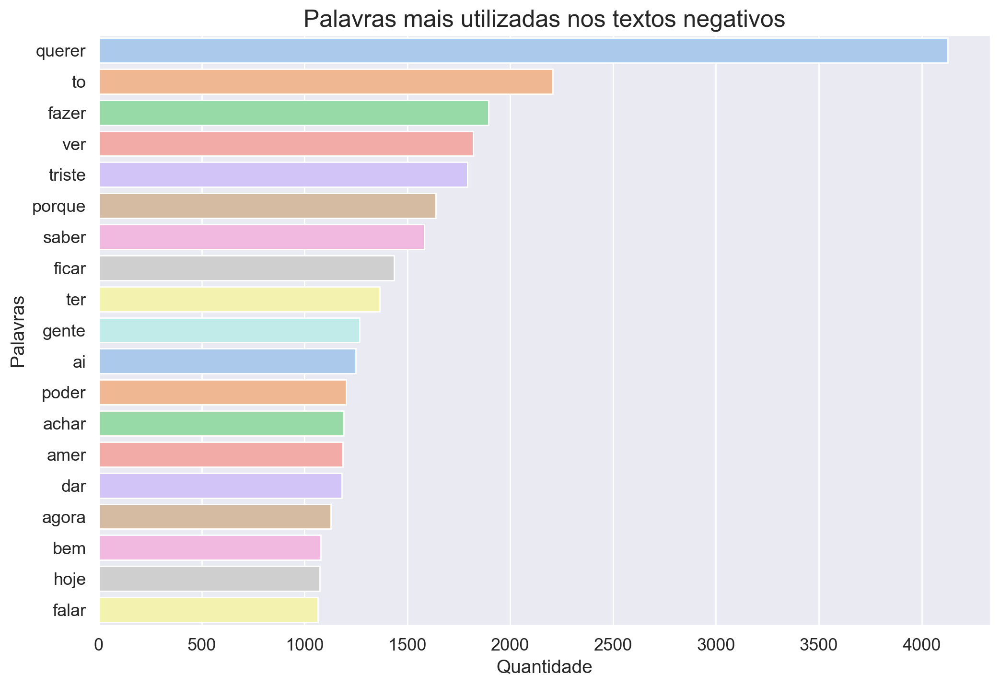

In [56]:
# Apresentação da quantidade de palavras mais utilizadas em sentimentos negativos

plt.figure(figsize=(12,8))

g = sns.barplot(x='Quantidade', y='Palavras', data=temp_negative, palette=colors)
g.set_title(f"Palavras mais utilizadas nos textos negativos")
g.set_xlabel(f"Quantidade")
g.set_ylabel("Palavras")
plt.show()


In [57]:
%%time

# O processamento desta célula leva em média 12 minutos, em uma máquina i7 com 12 cores e 32 ram 

# As 20 palavras utilizadas apenas para o sentimento negativo

Unique_Negative= words_unique(0, 20, raw_text)

print('As 20 palavras mais utilizadas apenas em Tweets negativos:')
Unique_Negative.style.background_gradient(cmap='Reds')


As 20 palavras mais utilizadas apenas em Tweets negativos:
CPU times: total: 7min 16s
Wall time: 7min 53s


,words,count
0,bege,22
1,talitayounan,22
2,namjoonamacaranguejinho,19
3,bakeoffbrasil,16
4,calorzinho,16
5,tristonho,16
6,desanimada,12
7,crescir,12
8,dodói,11
9,jeongguk,11


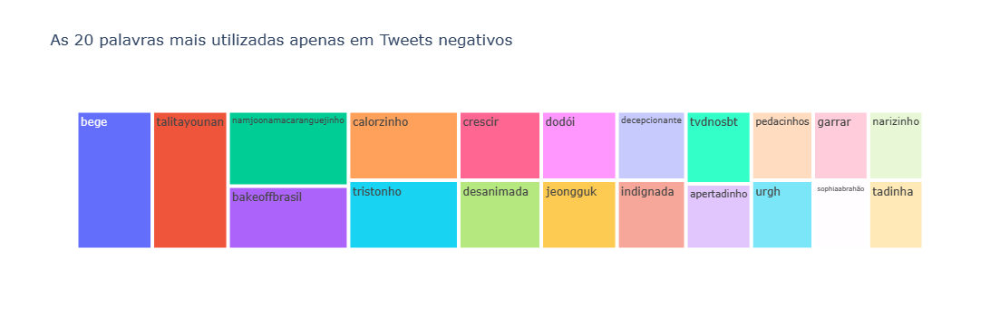

In [58]:
# As 20 palavras utilizadas apenas para o sentimento negativos

fig = px.treemap(Unique_Negative, path=['words'], values='count',title='As 20 palavras mais utilizadas apenas em Tweets negativos')
fig.show()


#### Sentimentos Positivos

In [59]:
# Palavras mais utilizadas em sentimentos positivos

top = Counter([item for sublist in Positive_sent['list_words'] for item in sublist])
temp_positive = pd.DataFrame(top.most_common(20))
temp_positive.columns = ['Palavras','Quantidade']
temp_positive.style.background_gradient(cmap=cmap_colors)


,Palavras,Quantidade
0,ir,5016
1,d,3730
2,fazer,2419
3,dia,2029
4,querer,1870
5,p,1790
6,bom,1714
7,ver,1659
8,bem,1637
9,poder,1581


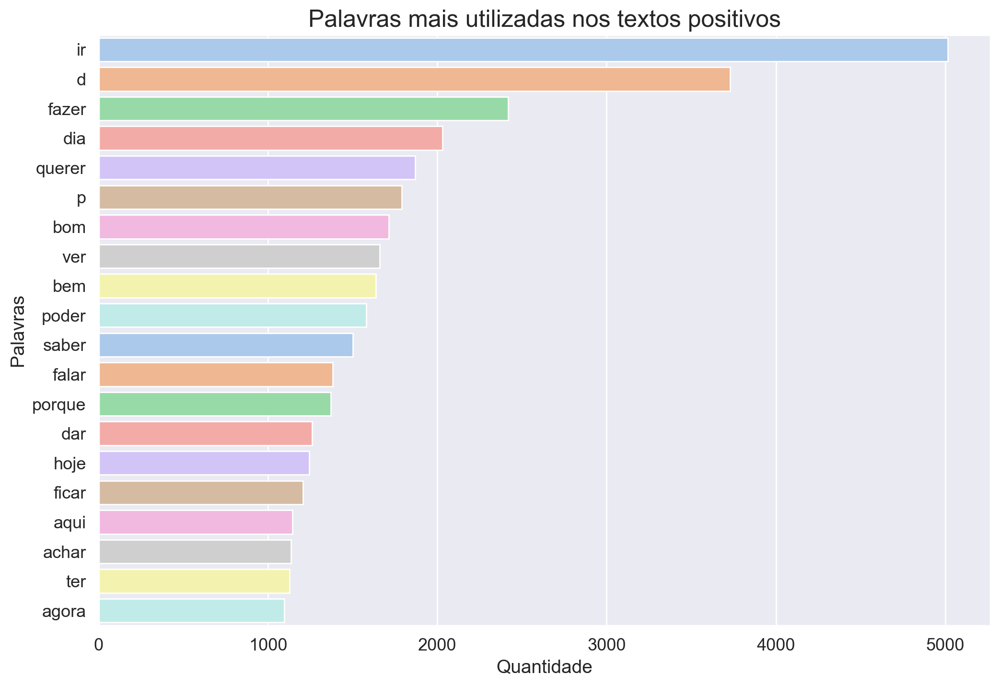

In [60]:
# Apresentação da quantidade de palavras mais utilizadas em sentimentos positivos

plt.figure(figsize=(12,8))

g = sns.barplot(x='Quantidade', y='Palavras', data=temp_positive, palette=colors)
g.set_title(f"Palavras mais utilizadas nos textos positivos")
g.set_xlabel(f"Quantidade")
g.set_ylabel("Palavras")
plt.show()


In [61]:
%%time

# O processamento desta célula leva em média 7 minutos, em uma máquina i7 com 12 cores e 32 ram 

# As 20 palavras utilizadas apenas para o sentimento positivo

Unique_Positive = words_unique(1, 20, raw_text)

print('As 20 palavras mais utilizadas apenas em Tweets positivos:')
Unique_Positive.style.background_gradient(cmap=cmap_colors)


As 20 palavras mais utilizadas apenas em Tweets positivos:
CPU times: total: 6min 19s
Wall time: 6min 51s


,words,count
0,viraviraciro,78
1,loveontoptvi,24
2,sabes,24
3,aturar,19
4,meangirlsday,17
5,beline,17
6,rani,16
7,happyjiminday,15
8,casulo,13
9,miúda,12


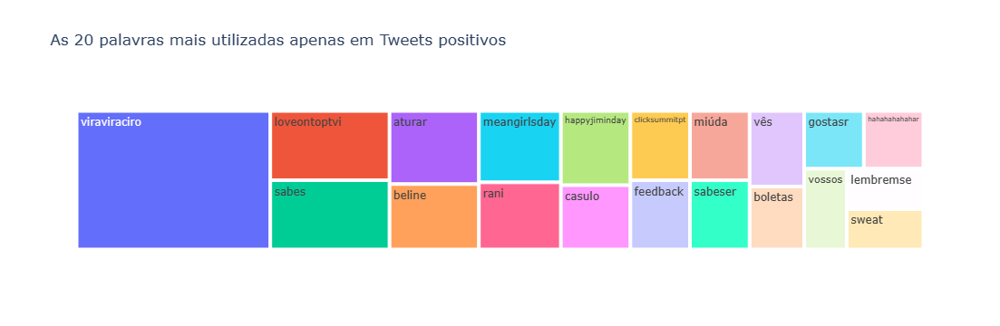

In [62]:
# Apresentação das palavras utilizadas em sentimentos positivos

fig = px.treemap(Unique_Positive, path=['words'], values='count',title='As 20 palavras mais utilizadas apenas em Tweets positivos')
fig.show()


#### Sentimentos Neutros

In [63]:
# Palavras mais utilizadas em sentimentos neutros

top = Counter([item for sublist in Neutral_sent['list_words'] for item in sublist])
temp_neutral = pd.DataFrame(top.most_common(20))
temp_neutral = temp_neutral.loc[1:,:]
temp_neutral.columns = ['Palavras','Quantidade']
temp_neutral.style.background_gradient(cmap=cmap_colors)


,Palavras,Quantidade
1,fato,3551
2,dizer,2905
3,bolsonaro,2787
4,oportunidade,2520
5,ver,2334
6,emprego,1833
7,fazer,1626
8,ir,1579
9,vaga,1554
10,brasil,1390


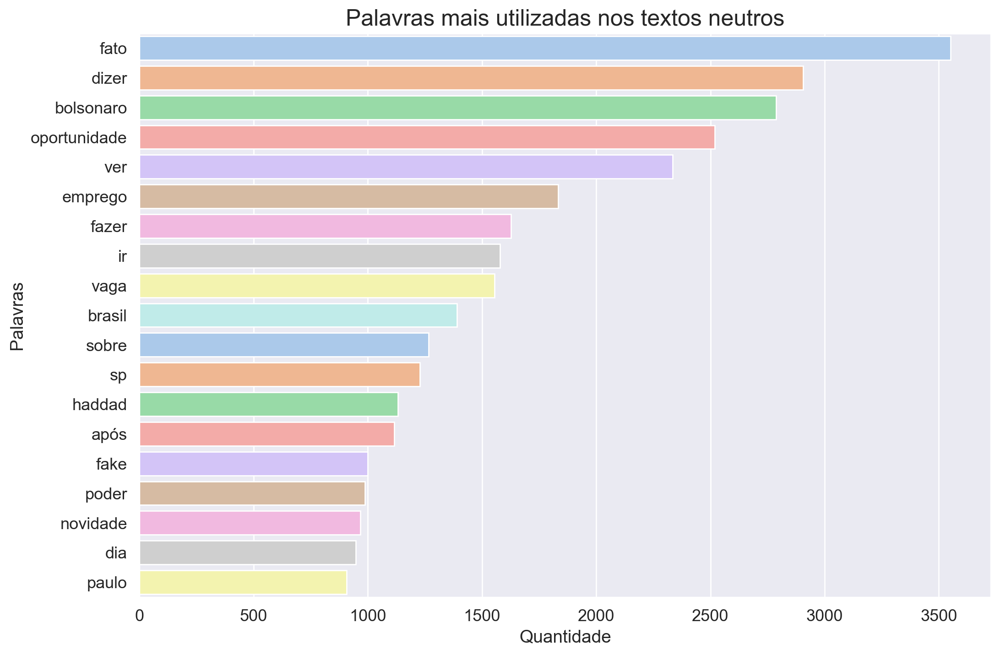

In [64]:
# Apresentação da quantidade de palavras mais utilizadas em sentimentos neutros

plt.figure(figsize=(12,8))

g = sns.barplot(x='Quantidade', y='Palavras', data=temp_neutral, palette=colors)
g.set_title(f"Palavras mais utilizadas nos textos neutros")
g.set_xlabel(f"Quantidade")
g.set_ylabel("Palavras")
plt.show()


In [65]:
%%time

# O processamento desta célula leva em média 8 minutos, em uma máquina i7 com 12 cores e 32 ram 

# As 20 palavras utilizadas apenas para o sentimento neutro

Unique_Neutral= words_unique(2, 20, raw_text)

print('As 20 palavras utilizadas apenas em Tweets neutros:')
Unique_Neutral.style.background_gradient(cmap=cmap_colors)


As 20 palavras utilizadas apenas em Tweets neutros:
CPU times: total: 5min 25s
Wall time: 5min 49s


,words,count
0,feedly,277
1,manualdosgames,158
2,mdg,158
3,salaodebeleza,134
4,katzoporra,114
5,beautysalon,100
6,florence,98
7,gazetaestadaojp,94
8,bispohairecia,93
9,inquérito,82


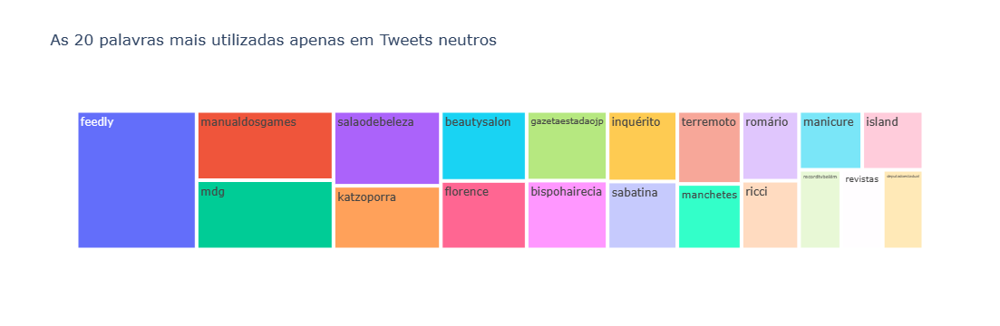

In [66]:
# Apresentação das palavras utilizadas em sentimentos neutros

fig = px.treemap(Unique_Neutral, path=['words'], values='count',title='As 20 palavras mais utilizadas apenas em Tweets neutros')
fig.show()


#### WordClouds

**Sentimentos negativos**

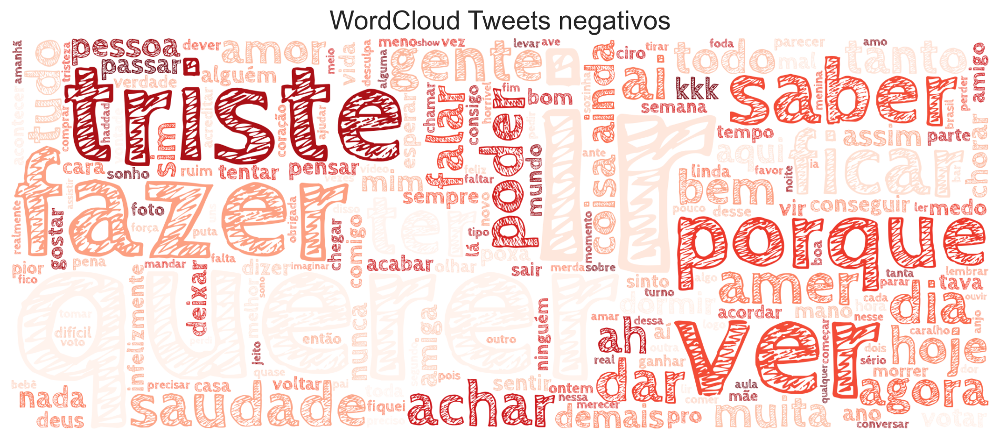

In [67]:
# WordCloud para Tweets negativos

text = ' '.join(Negative_sent['join_f_words'])
plot_wordcloud(text, title = 'WordCloud Tweets negativos', backcolor = 'white', clrmap = 'Reds')


**Sentimentos positivos**

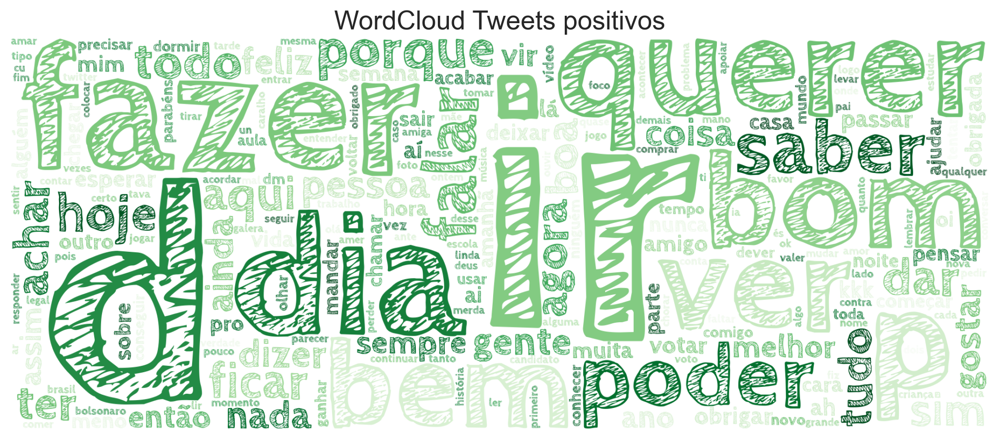

In [68]:
# WordCloud para Tweets positivos

text = ' '.join(Positive_sent['join_f_words'])
plot_wordcloud(text, title = 'WordCloud Tweets positivos', backcolor = 'white', clrmap = 'Greens')


**Sentimentos neutros**

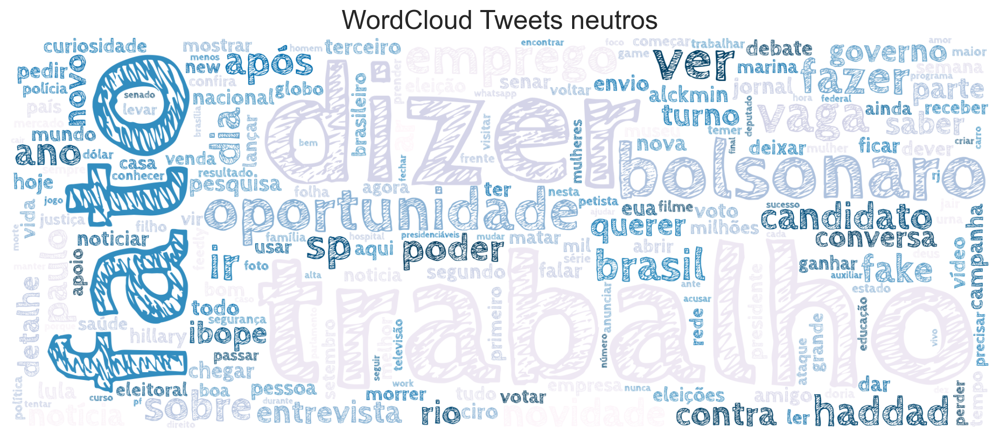

In [69]:
# WordCloud para Tweets neutros

text = ' '.join(Neutral_sent['join_f_words'])
plot_wordcloud(text, title = 'WordCloud Tweets neutros', backcolor = 'white', clrmap = 'PuBu')


---

**Conclusões:** 

- Podem ver que as mesmas palavras são comuns nos três segmentos;


- Isso é interessante porque algumas palavras são mais de natureza negativa e outras palavras são mais de natureza positiva, o que significa que o agrupamento das palavras (frases) definem os sentimentos;


- Olhando para as palavras únicas de cada sentimento, temos mais clareza sobre os dados, estas palavras únicas são determinantes para o sentimento dos tweets;


## 4. Treinamento do modelo

### Separando conjunto de dados Treino e Teste

In [70]:
# Carregando os arquivos tratados para não reprocessar a etapa 2. Pré-processamento e transformações

# Definindo o nome do arquivo
if use_normalize==1:
    file_name = './dados/train/Train3Classes_with_Token_normalize.csv'
    file_name_s = './dados/subm/Subm3Classes_with_Token_normalize.csv'
else:
    file_name = './dados/train/Train3Classes_with_Token.csv'
    file_name_s = './dados/subm/Subm3Classes_with_Token.csv'
  
# Salvando o CSV
try:
    # Carregar o dataframe
    dfc = reduce_mem_usage(pd.read_csv(file_name))
    dfs = reduce_mem_usage(pd.read_csv(file_name_s))
    
    #Incluindo lista de palavras
    dfc['list_words'] = dfc['join_f_words'].apply(lambda w:str(w).split())
    
    print(f'Arquivo carregado com successo.')
    
except:
    print(f'Ocorreu um erro no carregamento do arquivo.')
    

Mem. usage decreased to  2.50 Mb (50.0% reduction)
Mem. usage decreased to  0.24 Mb (29.2% reduction)
Arquivo carregado com successo.


In [71]:
# A nossa base de dados tem mais de 90 mil linhas e a quantidade de palavras disponíveis nos textos é muito grande. 
# Para evitar problemas de alocação de memória, processamento dos textos e modelagem, vamos criar uma amostra com 40% da base:

# Caso o notebook apresente problemas de alocação de memória, favor diminuir o percentual da amostra dos dados.

dfm = dfc.sample(frac=0.4, replace=False)


In [72]:
# Vamos dividir os nossos dados numa matriz X que contém as características a treinar, 
# e uma matriz y com a variável alvo, neste caso a coluna sentiment. 

X = dfm['join_f_words']
y = dfm['sentiment']


In [73]:
%%time

# Vamos dividir os dados num conjunto de Train e num conjunto de Test. 
# Iremos treinar o modelo no conjunto de treino e depois utilizaremos o conjunto de testes para avaliar o modelo

random_seed = 42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)


CPU times: total: 0 ns
Wall time: 5.01 ms


In [74]:
# Quantidade total da variável sentiment (target)

y.value_counts().sort_index()


sentiment
0    12380
1    12422
2    12661
Name: count, dtype: int64

In [75]:
# Quantidade separada para o conjunto de treino inicial

y_train.value_counts().sort_index()


sentiment
0    8592
1    8740
2    8892
Name: count, dtype: int64

In [76]:
# Quantidade separada para o conjunto de teste inicial

y_test.value_counts().sort_index()#(normalize = True)


sentiment
0    3788
1    3682
2    3769
Name: count, dtype: int64

### Processando modelos

In [77]:
# Lista de modelos para testes

list_models = [
    {'model_name': 'Dummy Classifier uniform',
     'estimator' : DummyClassifier(strategy='uniform', random_state=random_seed)},    
    {'model_name': 'Linear Support Vector Machine',
     'estimator' : LinearSVC(random_state=random_seed)},
    {'model_name': 'Stochastic Gradient Descent Classifier',
     'estimator' : SGDClassifier(n_jobs=-1, loss='modified_huber',random_state=random_seed)},
    {'model_name': 'LightGBM',
     'estimator' : LGBMClassifier(random_state=random_seed,force_col_wise=True)},
    {'model_name': 'Logistic Regression',
     'estimator' : LogisticRegression(random_state=random_seed)},
    {'model_name': 'Classifier Ridge regression',
     'estimator' : RidgeClassifier(random_state=random_seed)},
    {'model_name': 'Bernoulli Naive Bayes',
     'estimator' : BernoulliNB()},
    {'model_name': 'XGBoost',
     'estimator' : XGBClassifier(random_state=random_seed)}
]

# Os modelos abaixo foram retirados por apresentarem tempo de processamento superior 20 minutos com sample de 40% 
# e apresentarem resultado de acurácia muito similares com os modelos escolhidos

#{'model_name': 'Decision Tree',
# 'estimator' : DecisionTreeClassifier(random_state=random_seed)},
#{'model_name': 'Random Forest',
# 'estimator' : RandomForestClassifier(random_state=random_seed)}, 
#{'model_name': 'AdaBoost',
# 'estimator' : AdaBoostClassifier(random_state=random_seed)},
#{'model_name': 'GradientBoosting',
# 'estimator' : GradientBoostingClassifier(random_state=random_seed)},
#{'model_name': 'XGBoost',
# 'estimator' : XGBClassifier(random_state=random_seed)}
#{'model_name': 'Support Vector Machine',
# 'estimator' : SVC(random_state=random_seed)},
#{'model_name': 'KNN (k-nearest neighbor)',
# 'estimator' : KNeighborsClassifier(n_neighbors=3)},
#{'model_name': 'Multinomial Naive Bayes',
#'estimator' : MultinomialNB()},
#{'model_name': 'Naive Bayes Gaussian',
#'estimator' : GaussianNB()},



#### Técnica CountVectorizer

In [78]:
# Instanciando CountVectorizer

cv = CountVectorizer()


In [79]:
# Treinando o modelo com os conjuntos de dados de treinamento 

X_train_cv = cv.fit_transform(X_train).toarray()
X_test_cv = cv.transform(X_test).toarray()


**Processando modelos**


Model      : Dummy Classifier uniform
Accuracy   : 0.3394 
Precision  : 0.3395 
Recall     : 0.3394 
F1 - Score : 0.3394 
MAE        : 0.8813 
RMSE       : 1.1501 
R2         : -0.9671 

              precision    recall  f1-score   support

           0       0.34      0.34      0.34      3788
           1       0.33      0.34      0.34      3682
           2       0.35      0.34      0.34      3769

    accuracy                           0.34     11239
   macro avg       0.34      0.34      0.34     11239
weighted avg       0.34      0.34      0.34     11239



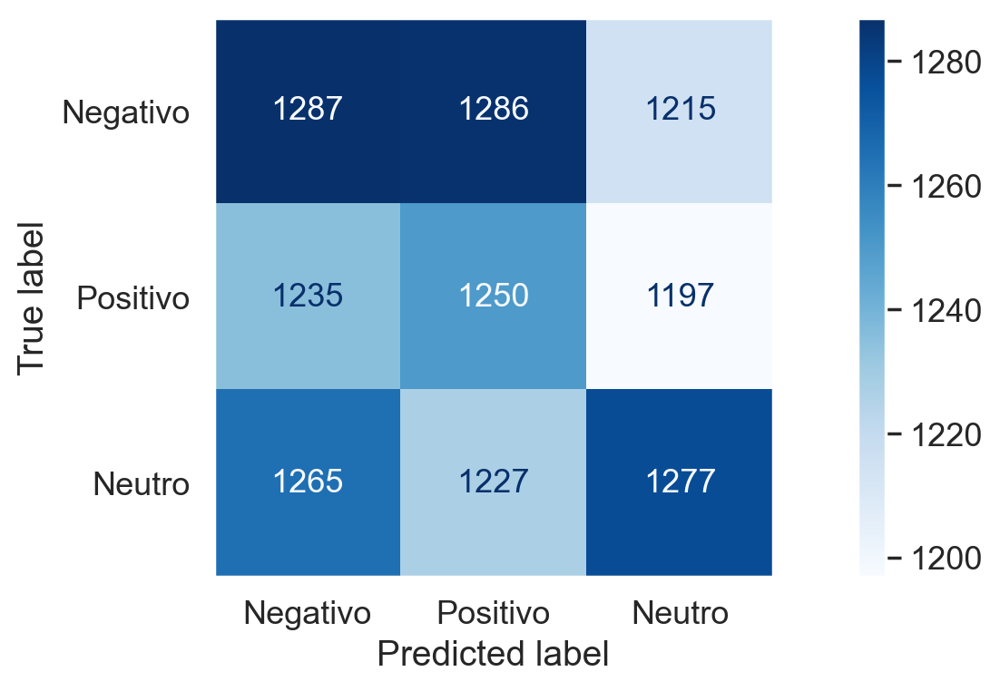

Partial time: 0:00:00.245002

Model      : Linear Support Vector Machine
Accuracy   : 0.7587 
Precision  : 0.7610 
Recall     : 0.7587 
F1 - Score : 0.7597 
MAE        : 0.2569 
RMSE       : 0.5367 
R2         : 0.5717 

              precision    recall  f1-score   support

           0       0.69      0.72      0.70      3788
           1       0.66      0.65      0.65      3682
           2       0.93      0.91      0.92      3769

    accuracy                           0.76     11239
   macro avg       0.76      0.76      0.76     11239
weighted avg       0.76      0.76      0.76     11239



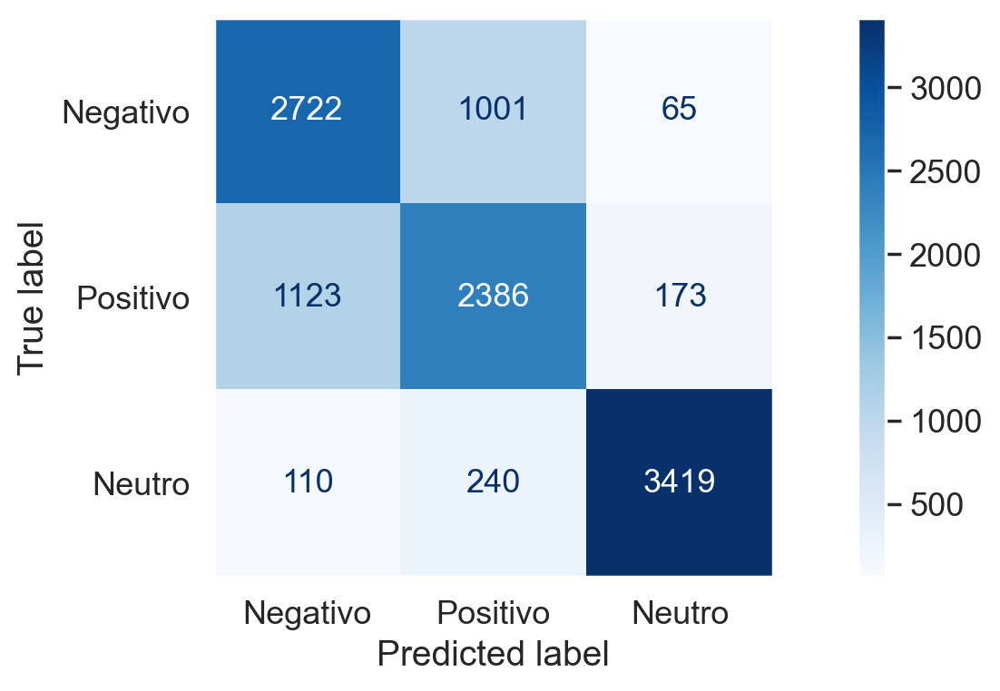

Partial time: 0:00:09.326070

Model      : Stochastic Gradient Descent Classifier
Accuracy   : 0.7669 
Precision  : 0.7677 
Recall     : 0.7669 
F1 - Score : 0.7673 
MAE        : 0.2466 
RMSE       : 0.5232 
R2         : 0.5930 

              precision    recall  f1-score   support

           0       0.71      0.70      0.71      3788
           1       0.66      0.68      0.67      3682
           2       0.93      0.92      0.93      3769

    accuracy                           0.77     11239
   macro avg       0.77      0.77      0.77     11239
weighted avg       0.77      0.77      0.77     11239



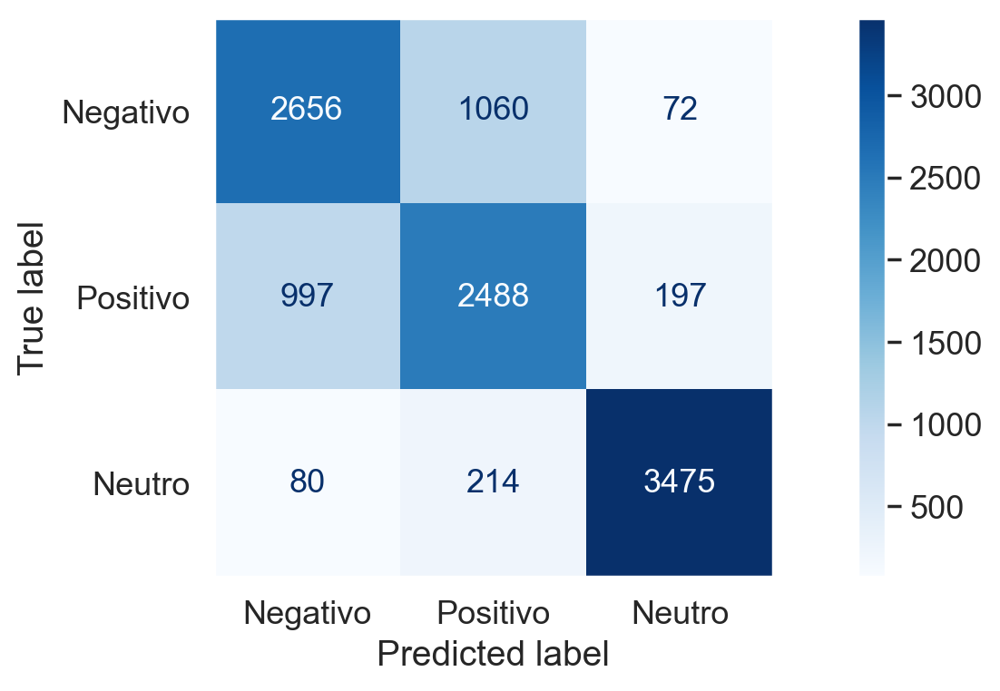

Partial time: 0:00:47.205079
[LightGBM] [Info] Total Bins 4181
[LightGBM] [Info] Number of data points in the train set: 26224, number of used features: 1587
[LightGBM] [Info] Start training from score -1.115843
[LightGBM] [Info] Start training from score -1.098765
[LightGBM] [Info] Start training from score -1.081523

Model      : LightGBM
Accuracy   : 0.7387 
Precision  : 0.7495 
Recall     : 0.7387 
F1 - Score : 0.7403 
MAE        : 0.2814 
RMSE       : 0.5671 
R2         : 0.5216 

              precision    recall  f1-score   support

           0       0.73      0.61      0.67      3788
           1       0.61      0.74      0.67      3682
           2       0.91      0.87      0.89      3769

    accuracy                           0.74     11239
   macro avg       0.75      0.74      0.74     11239
weighted avg       0.75      0.74      0.74     11239



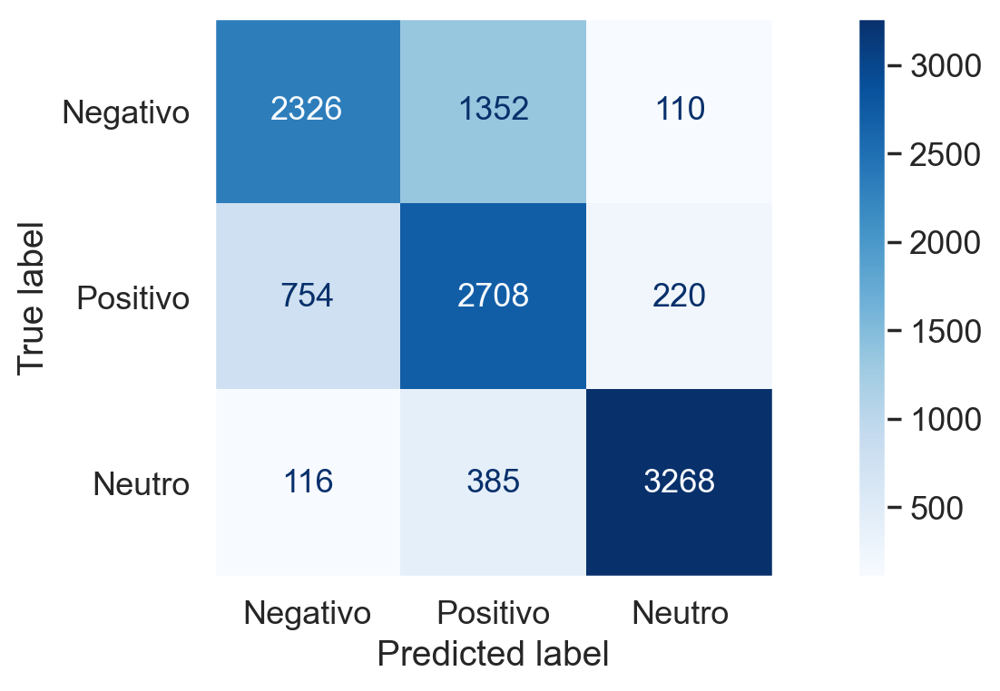

Partial time: 0:00:06.121602

Model      : Logistic Regression
Accuracy   : 0.7714 
Precision  : 0.7730 
Recall     : 0.7714 
F1 - Score : 0.7722 
MAE        : 0.2432 
RMSE       : 0.5219 
R2         : 0.5949 

              precision    recall  f1-score   support

           0       0.71      0.72      0.71      3788
           1       0.67      0.68      0.68      3682
           2       0.94      0.92      0.93      3769

    accuracy                           0.77     11239
   macro avg       0.77      0.77      0.77     11239
weighted avg       0.77      0.77      0.77     11239



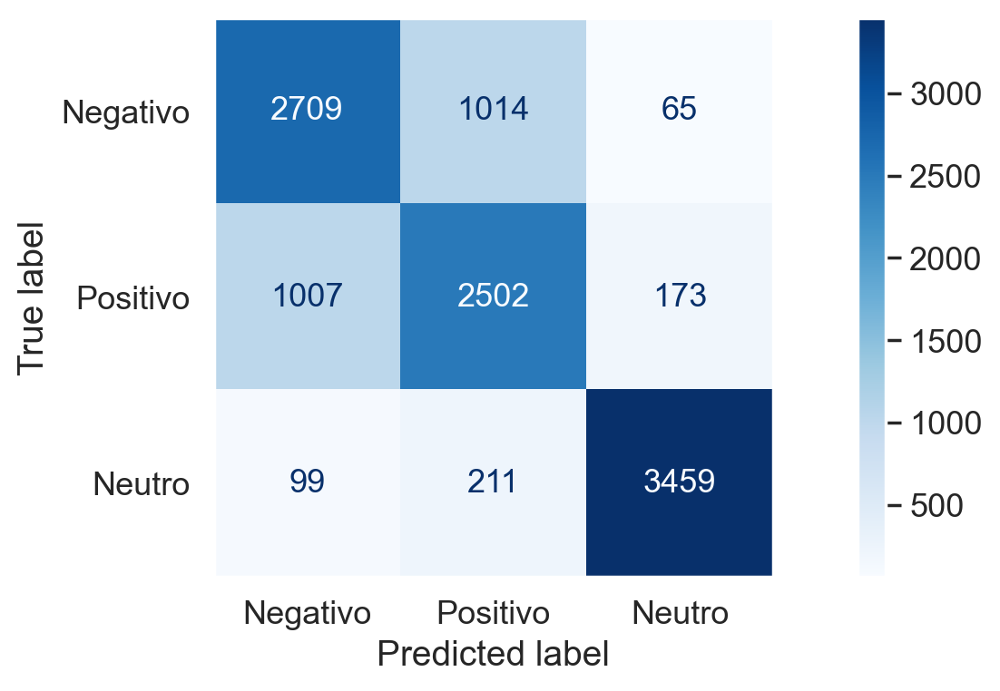

Partial time: 0:01:01.942093

Model      : Classifier Ridge regression
Accuracy   : 0.7467 
Precision  : 0.7504 
Recall     : 0.7467 
F1 - Score : 0.7482 
MAE        : 0.2760 
RMSE       : 0.5669 
R2         : 0.5220 

              precision    recall  f1-score   support

           0       0.68      0.72      0.70      3788
           1       0.65      0.64      0.65      3682
           2       0.92      0.88      0.90      3769

    accuracy                           0.75     11239
   macro avg       0.75      0.75      0.75     11239
weighted avg       0.75      0.75      0.75     11239



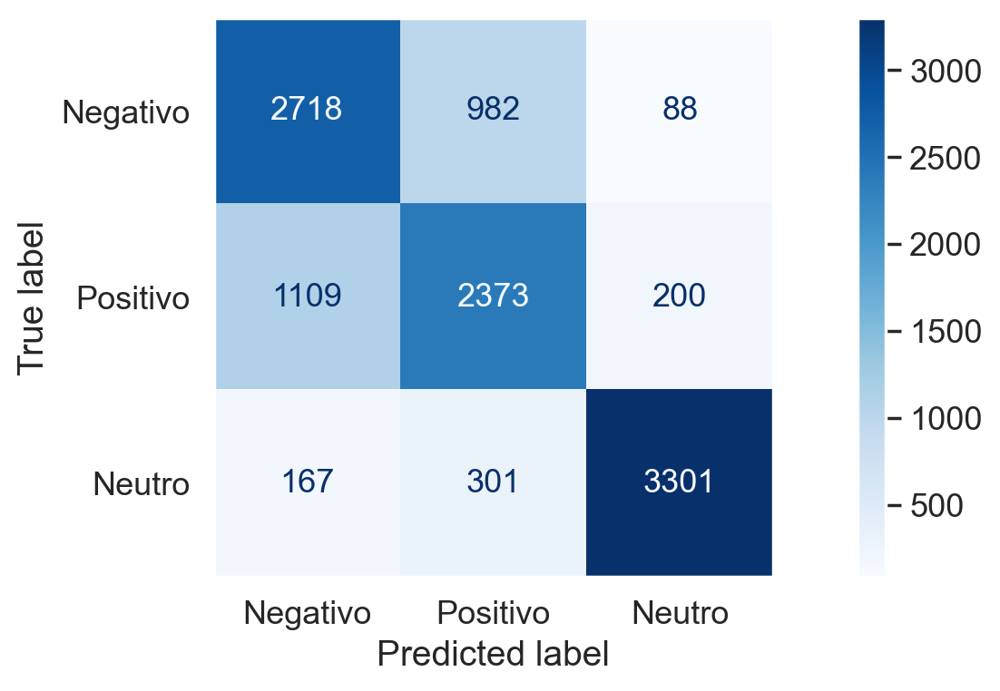

Partial time: 0:03:06.895272

Model      : Bernoulli Naive Bayes
Accuracy   : 0.7541 
Precision  : 0.7635 
Recall     : 0.7541 
F1 - Score : 0.7523 
MAE        : 0.2635 
RMSE       : 0.5466 
R2         : 0.5556 

              precision    recall  f1-score   support

           0       0.65      0.83      0.73      3788
           1       0.69      0.55      0.61      3682
           2       0.95      0.88      0.91      3769

    accuracy                           0.75     11239
   macro avg       0.76      0.75      0.75     11239
weighted avg       0.76      0.75      0.75     11239



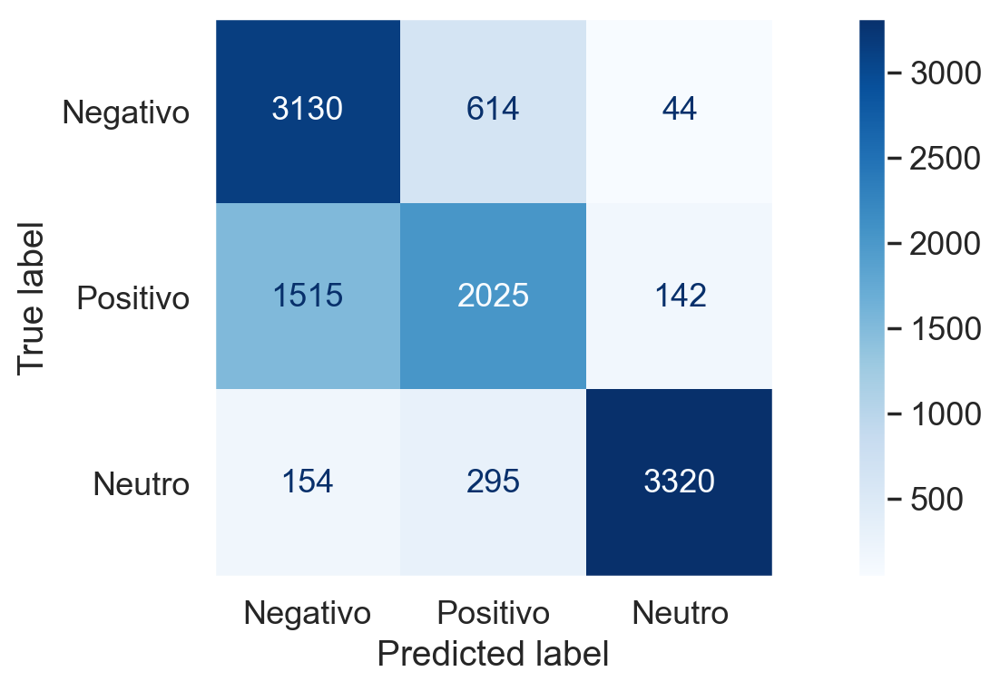

Partial time: 0:00:28.315888

Model      : Decision Tree
Accuracy   : 0.7333 
Precision  : 0.7377 
Recall     : 0.7333 
F1 - Score : 0.7349 
MAE        : 0.2885 
RMSE       : 0.5763 
R2         : 0.5060 

              precision    recall  f1-score   support

           0       0.66      0.71      0.68      3788
           1       0.63      0.62      0.62      3682
           2       0.92      0.87      0.90      3769

    accuracy                           0.73     11239
   macro avg       0.74      0.73      0.73     11239
weighted avg       0.74      0.73      0.73     11239



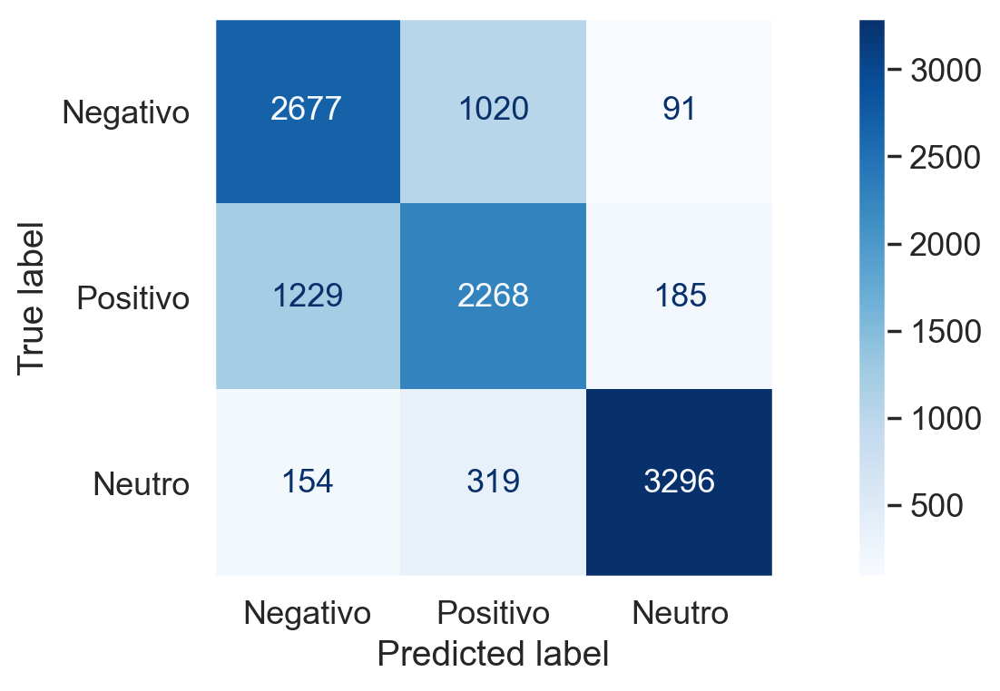

Partial time: 0:13:33.981959

Model      : AdaBoost
Accuracy   : 0.6222 
Precision  : 0.7034 
Recall     : 0.6222 
F1 - Score : 0.6199 
MAE        : 0.3912 
RMSE       : 0.6466 
R2         : 0.3782 

              precision    recall  f1-score   support

           0       0.75      0.37      0.49      3788
           1       0.47      0.83      0.60      3682
           2       0.89      0.68      0.77      3769

    accuracy                           0.62     11239
   macro avg       0.70      0.62      0.62     11239
weighted avg       0.70      0.62      0.62     11239



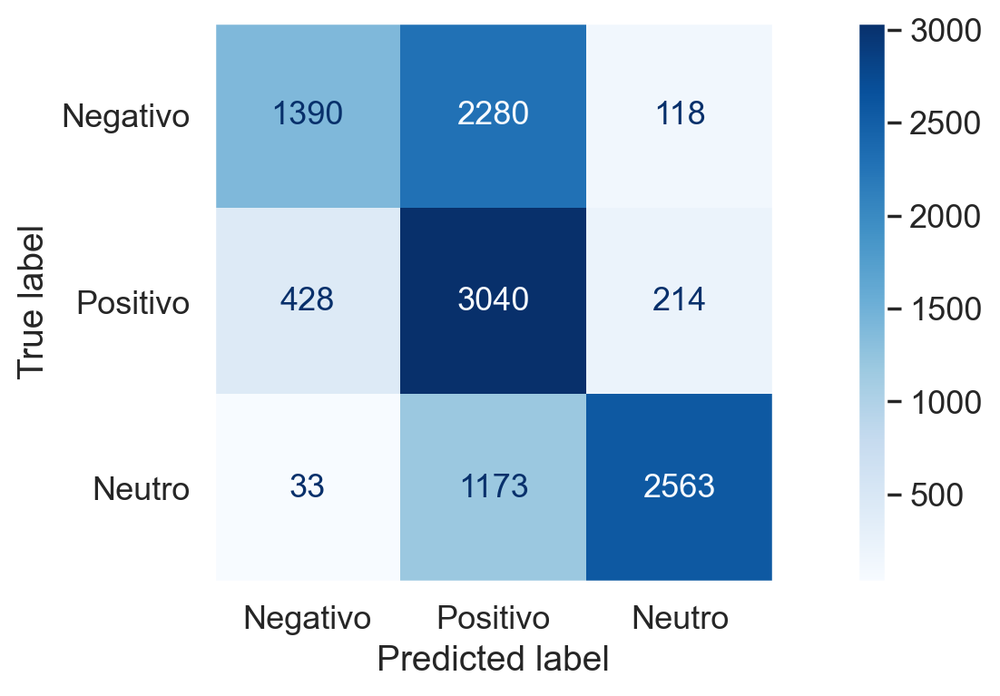

Partial time: 0:14:00.240775

Model      : XGBoost
Accuracy   : 0.7228 
Precision  : 0.7439 
Recall     : 0.7228 
F1 - Score : 0.7252 
MAE        : 0.2974 
RMSE       : 0.5812 
R2         : 0.4977 

              precision    recall  f1-score   support

           0       0.73      0.57      0.64      3788
           1       0.58      0.77      0.66      3682
           2       0.91      0.83      0.87      3769

    accuracy                           0.72     11239
   macro avg       0.74      0.72      0.72     11239
weighted avg       0.74      0.72      0.73     11239



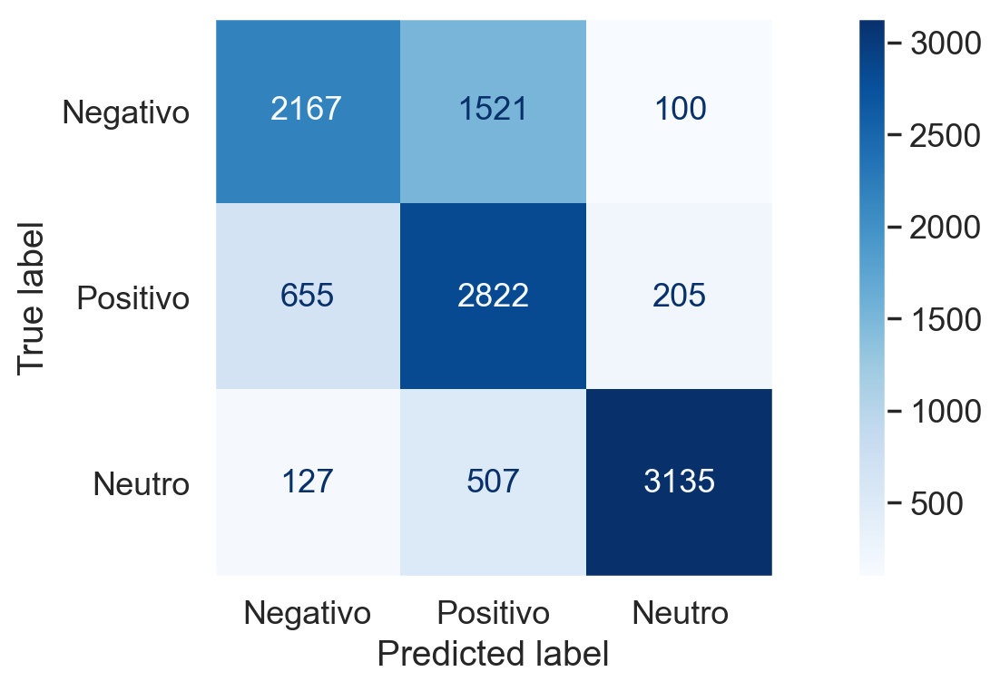

Partial time: 0:01:58.013807
CPU times: total: 1h 3min 58s
Wall time: 35min 12s


In [80]:
%%time

# O processamento desta célula com o processamento dos modelos leva em média 5 minutos, em uma máquina i7 com 12 cores e 32 ram 

# Processando os modelos baseado na list_models
score = []

test_models (list_models,
             "model_name",
             "estimator",
             "CountVectorizer",
             X_train_cv,
             X_test_cv,
             y_train,
             y_test)


#### Técnica TF-IDF

In [81]:
#Instanciando TF-IDF

tfidf = TfidfVectorizer()


In [82]:
# Treinando o modelo com os conjuntos de dados de treinamento 

X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf  = tfidf.transform(X_test)

#X_train_tfidf = tfidf.fit_transform(X_train).todense()
#X_test_tfidf  = tfidf.transform(X_test).todense()


**Processando modelos**


Model      : Dummy Classifier uniform
Accuracy   : 0.3394 
Precision  : 0.3395 
Recall     : 0.3394 
F1 - Score : 0.3394 
MAE        : 0.8813 
RMSE       : 1.1501 
R2         : -0.9671 

              precision    recall  f1-score   support

           0       0.34      0.34      0.34      3788
           1       0.33      0.34      0.34      3682
           2       0.35      0.34      0.34      3769

    accuracy                           0.34     11239
   macro avg       0.34      0.34      0.34     11239
weighted avg       0.34      0.34      0.34     11239



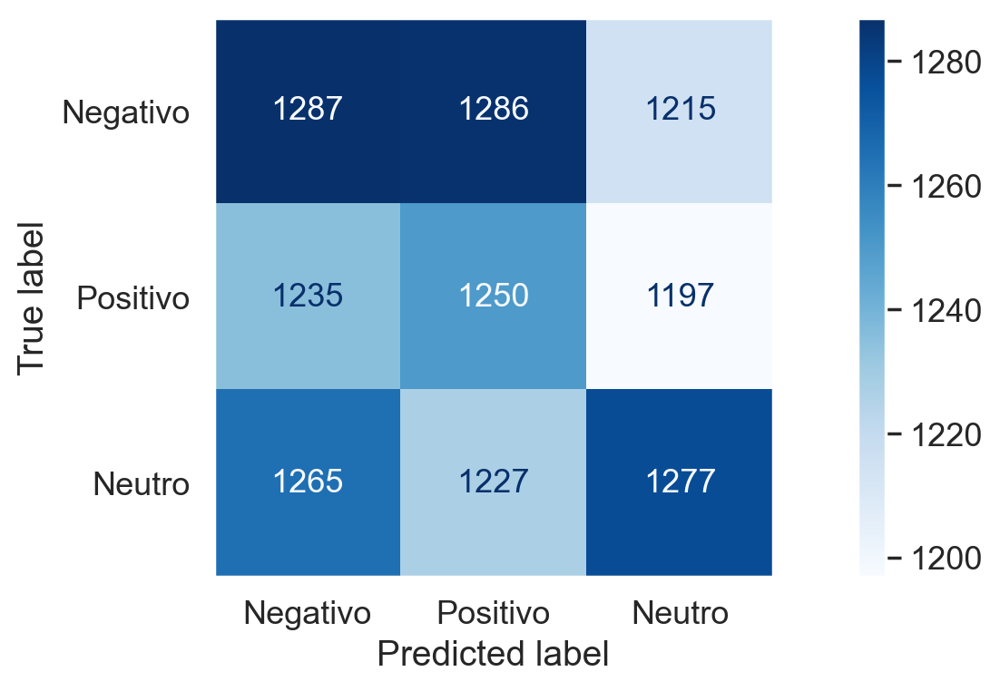

Partial time: 0:00:00.286408

Model      : Linear Support Vector Machine
Accuracy   : 0.7717 
Precision  : 0.7697 
Recall     : 0.7717 
F1 - Score : 0.7704 
MAE        : 0.2416 
RMSE       : 0.5178 
R2         : 0.6013 

              precision    recall  f1-score   support

           0       0.73      0.69      0.71      3788
           1       0.67      0.68      0.67      3682
           2       0.91      0.94      0.93      3769

    accuracy                           0.77     11239
   macro avg       0.77      0.77      0.77     11239
weighted avg       0.77      0.77      0.77     11239



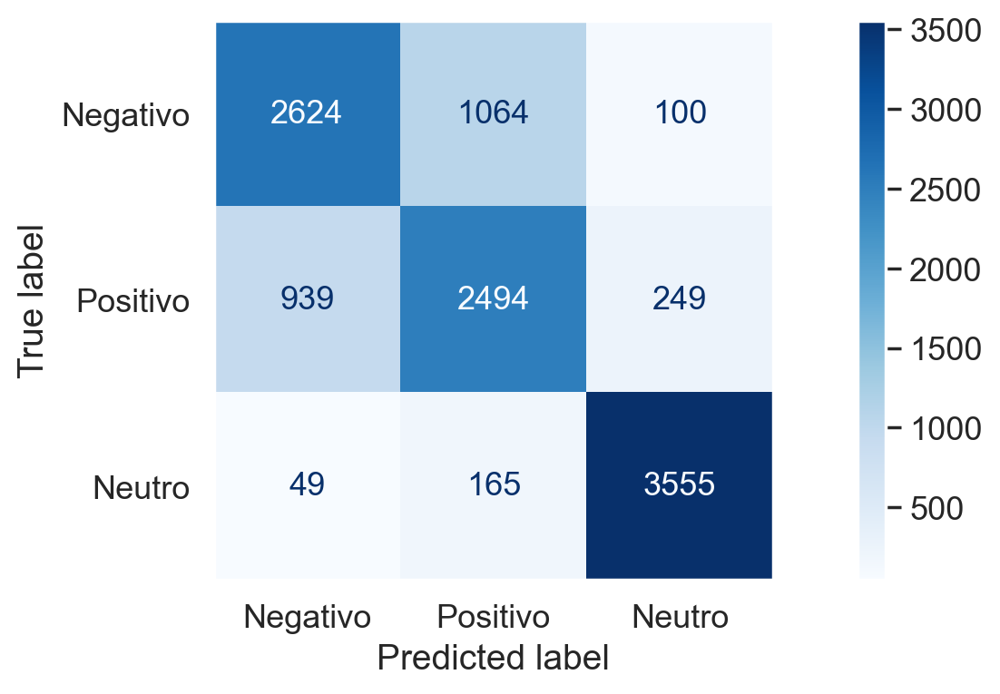

Partial time: 0:00:00.482079

Model      : Stochastic Gradient Descent Classifier
Accuracy   : 0.7767 
Precision  : 0.7742 
Recall     : 0.7767 
F1 - Score : 0.7748 
MAE        : 0.2363 
RMSE       : 0.5122 
R2         : 0.6099 

              precision    recall  f1-score   support

           0       0.74      0.69      0.71      3788
           1       0.68      0.69      0.68      3682
           2       0.90      0.95      0.93      3769

    accuracy                           0.78     11239
   macro avg       0.77      0.78      0.77     11239
weighted avg       0.77      0.78      0.77     11239



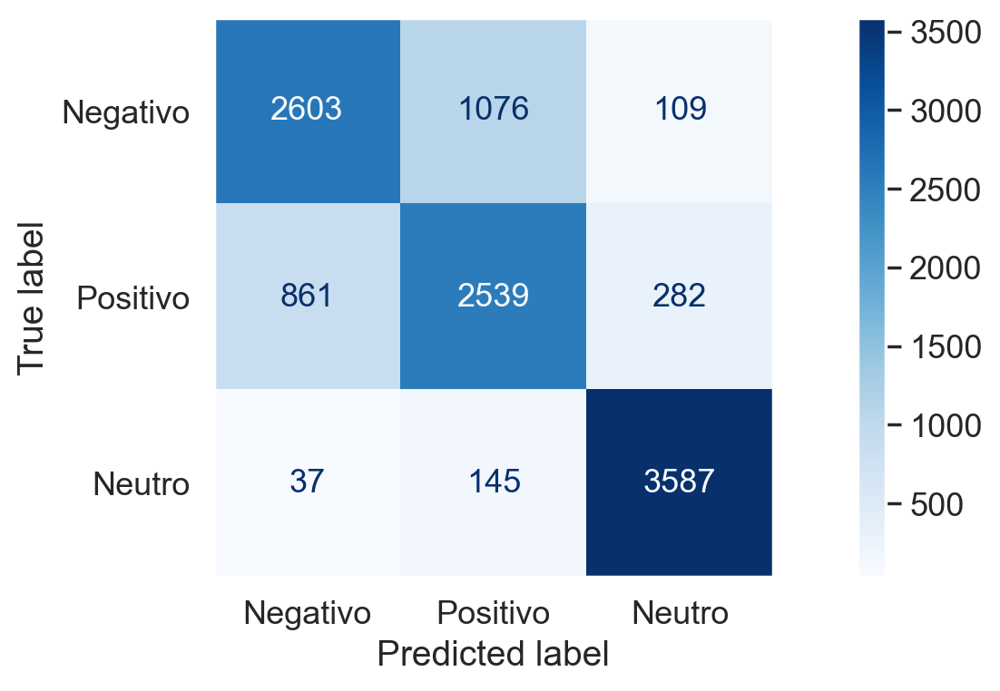

Partial time: 0:00:00.545555
[LightGBM] [Info] Total Bins 43740
[LightGBM] [Info] Number of data points in the train set: 26224, number of used features: 1587
[LightGBM] [Info] Start training from score -1.115843
[LightGBM] [Info] Start training from score -1.098765
[LightGBM] [Info] Start training from score -1.081523

Model      : LightGBM
Accuracy   : 0.7431 
Precision  : 0.7527 
Recall     : 0.7431 
F1 - Score : 0.7449 
MAE        : 0.2740 
RMSE       : 0.5553 
R2         : 0.5414 

              precision    recall  f1-score   support

           0       0.73      0.63      0.67      3788
           1       0.61      0.73      0.67      3682
           2       0.91      0.88      0.89      3769

    accuracy                           0.74     11239
   macro avg       0.75      0.74      0.74     11239
weighted avg       0.75      0.74      0.74     11239



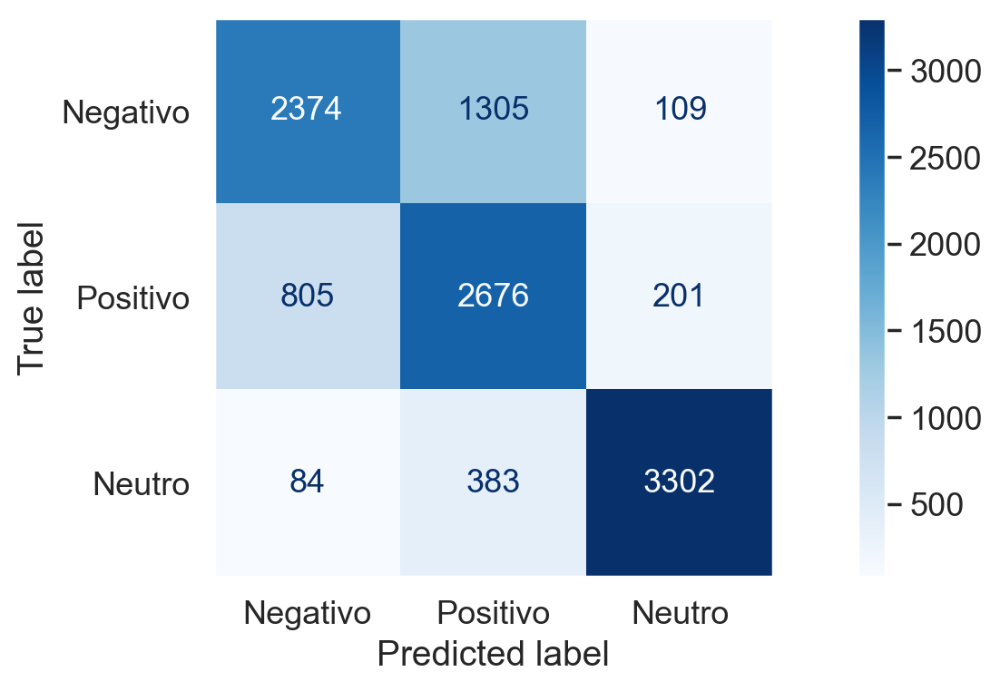

Partial time: 0:00:03.679464

Model      : Logistic Regression
Accuracy   : 0.7771 
Precision  : 0.7761 
Recall     : 0.7771 
F1 - Score : 0.7759 
MAE        : 0.2372 
RMSE       : 0.5156 
R2         : 0.6046 

              precision    recall  f1-score   support

           0       0.75      0.69      0.72      3788
           1       0.67      0.70      0.69      3682
           2       0.90      0.94      0.92      3769

    accuracy                           0.78     11239
   macro avg       0.78      0.78      0.78     11239
weighted avg       0.78      0.78      0.78     11239



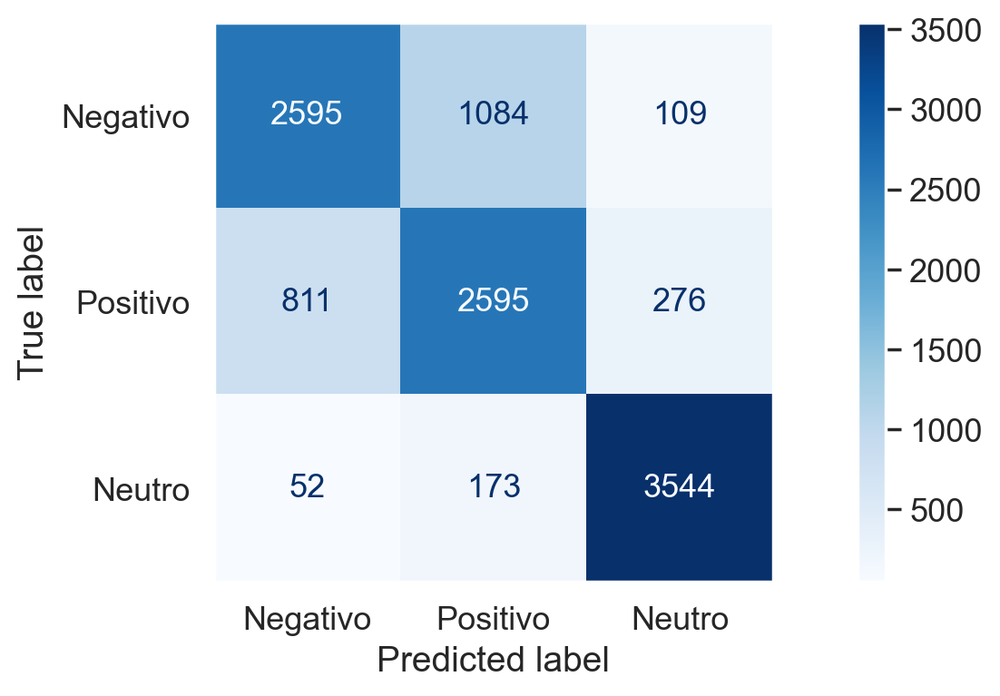

Partial time: 0:00:02.069195

Model      : Classifier Ridge regression
Accuracy   : 0.7700 
Precision  : 0.7674 
Recall     : 0.7700 
F1 - Score : 0.7683 
MAE        : 0.2458 
RMSE       : 0.5268 
R2         : 0.5873 

              precision    recall  f1-score   support

           0       0.73      0.69      0.71      3788
           1       0.67      0.68      0.67      3682
           2       0.90      0.94      0.92      3769

    accuracy                           0.77     11239
   macro avg       0.77      0.77      0.77     11239
weighted avg       0.77      0.77      0.77     11239



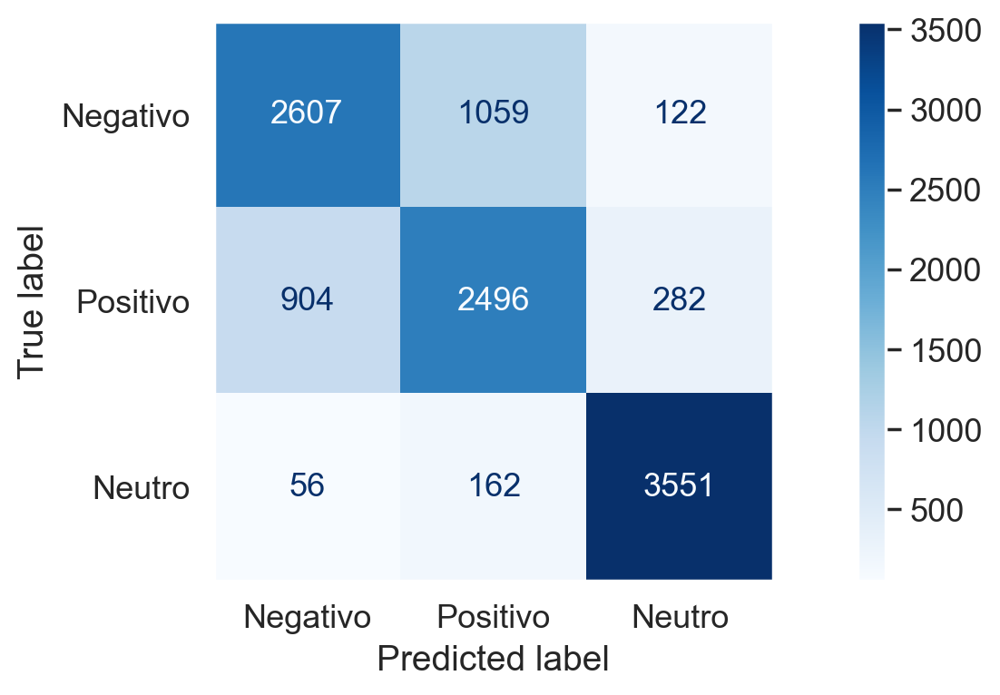

Partial time: 0:00:00.596222

Model      : Bernoulli Naive Bayes
Accuracy   : 0.7541 
Precision  : 0.7635 
Recall     : 0.7541 
F1 - Score : 0.7523 
MAE        : 0.2635 
RMSE       : 0.5466 
R2         : 0.5556 

              precision    recall  f1-score   support

           0       0.65      0.83      0.73      3788
           1       0.69      0.55      0.61      3682
           2       0.95      0.88      0.91      3769

    accuracy                           0.75     11239
   macro avg       0.76      0.75      0.75     11239
weighted avg       0.76      0.75      0.75     11239



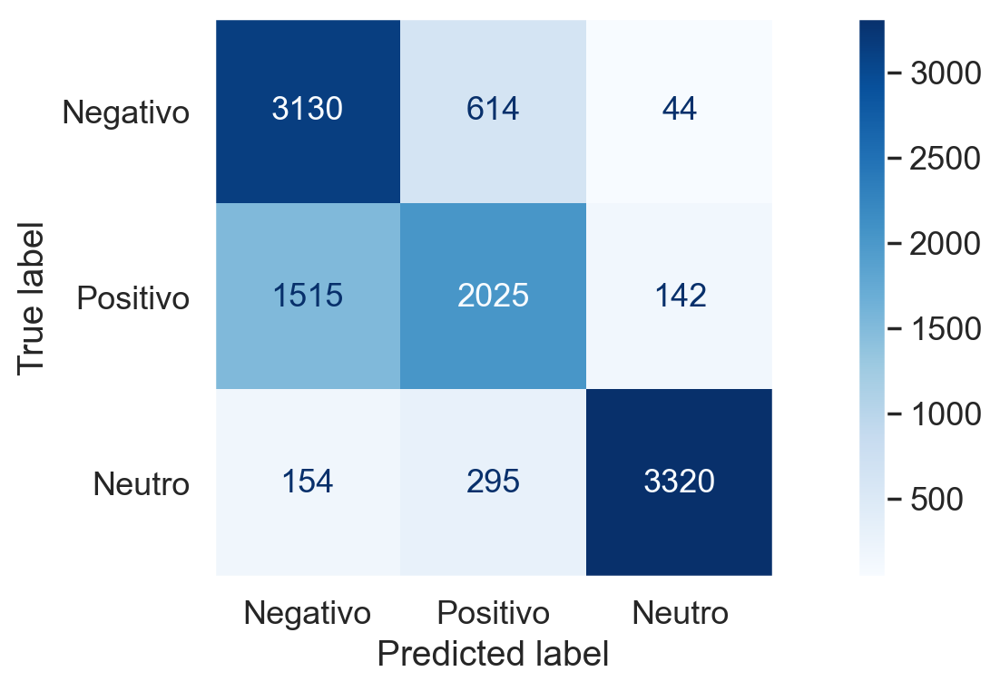

Partial time: 0:00:00.294729

Model      : Decision Tree
Accuracy   : 0.7512 
Precision  : 0.7547 
Recall     : 0.7512 
F1 - Score : 0.7514 
MAE        : 0.2636 
RMSE       : 0.5416 
R2         : 0.5637 

              precision    recall  f1-score   support

           0       0.73      0.64      0.68      3788
           1       0.63      0.70      0.66      3682
           2       0.91      0.91      0.91      3769

    accuracy                           0.75     11239
   macro avg       0.75      0.75      0.75     11239
weighted avg       0.75      0.75      0.75     11239



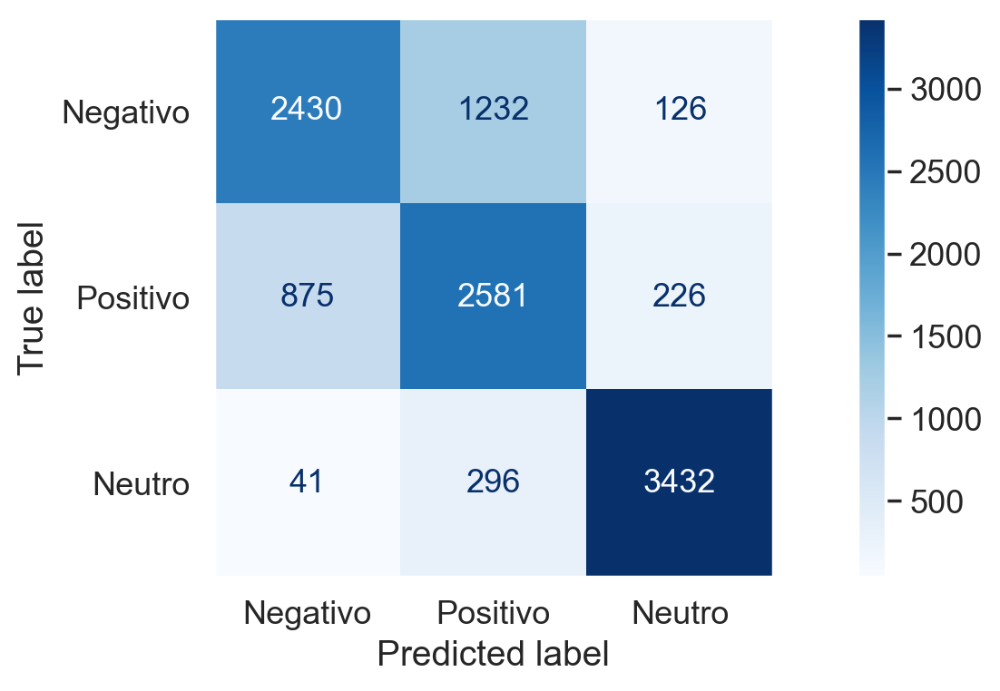

Partial time: 0:04:07.623871

Model      : AdaBoost
Accuracy   : 0.6239 
Precision  : 0.7086 
Recall     : 0.6239 
F1 - Score : 0.6184 
MAE        : 0.3897 
RMSE       : 0.6457 
R2         : 0.3799 

              precision    recall  f1-score   support

           0       0.77      0.35      0.48      3788
           1       0.47      0.84      0.60      3682
           2       0.88      0.69      0.78      3769

    accuracy                           0.62     11239
   macro avg       0.71      0.63      0.62     11239
weighted avg       0.71      0.62      0.62     11239



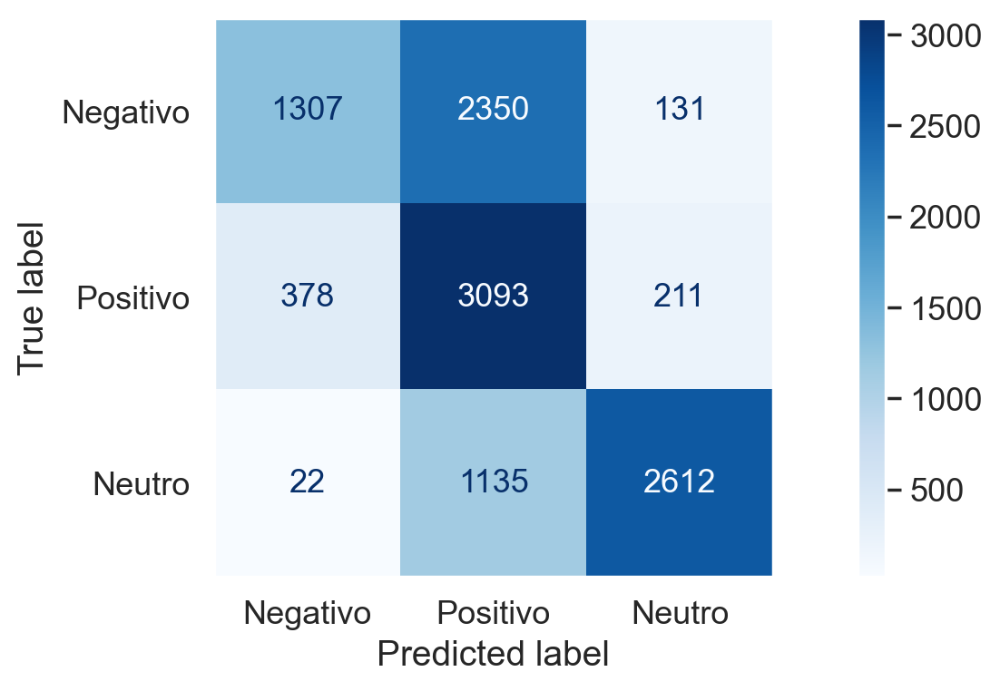

Partial time: 0:00:05.066566

Model      : XGBoost
Accuracy   : 0.7287 
Precision  : 0.7475 
Recall     : 0.7287 
F1 - Score : 0.7316 
MAE        : 0.2896 
RMSE       : 0.5712 
R2         : 0.5148 

              precision    recall  f1-score   support

           0       0.73      0.59      0.65      3788
           1       0.59      0.76      0.66      3682
           2       0.92      0.84      0.88      3769

    accuracy                           0.73     11239
   macro avg       0.75      0.73      0.73     11239
weighted avg       0.75      0.73      0.73     11239



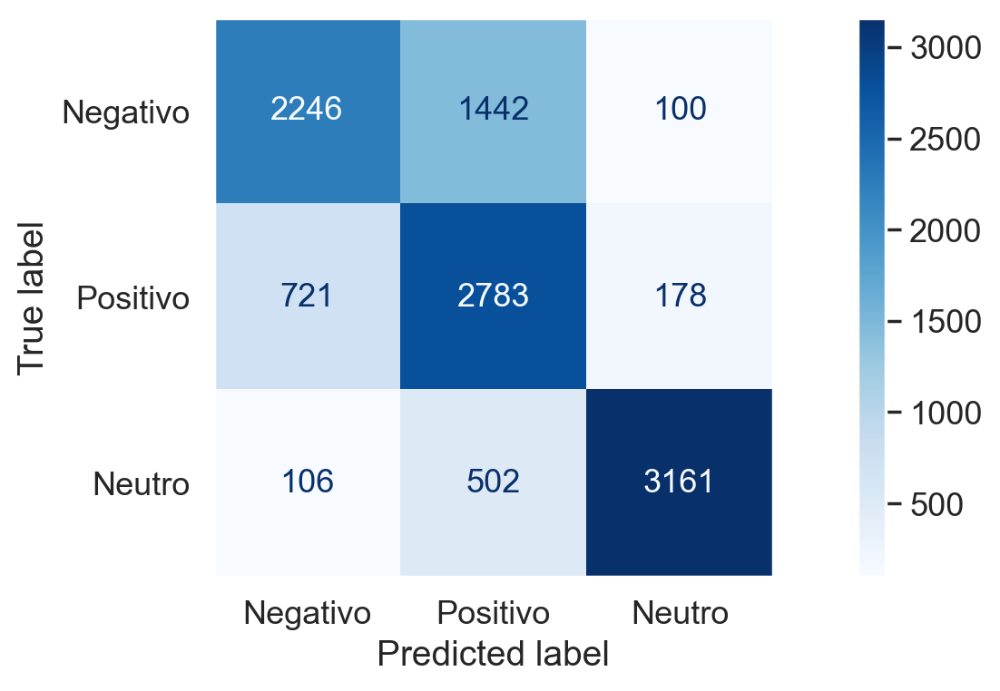

Partial time: 0:00:24.868969
CPU times: total: 8min 40s
Wall time: 4min 45s


In [83]:
%%time

# O processamento desta célula com o processamento dos modelos leva em média 15 minutos, em uma máquina i7 com 12 cores e 32 ram 

# Processando os modelos baseado na list_models

test_models (list_models,
             "model_name",
             "estimator",
             "TF-IDF",
             X_train_tfidf,
             X_test_tfidf,
             y_train,
             y_test)


#### Técnica Doc2Vec

In [84]:
# Instanciando Doc2Vec

d2v = doc2vec.Doc2Vec(vector_size=50, min_count=2, epochs=20)


In [85]:
# Vamos dividir os nossos dados numa matriz X que contém as características a treinar, 
# e uma matriz y com a variável alvo, neste caso a coluna sentiment. 

X_d2v = dfm['list_words']
y_d2v = dfm['sentiment']


In [86]:
# Vamos dividir os dados num conjunto de Train e num conjunto de Test. 
# Iremos treinar o modelo no conjunto de treino e depois utilizaremos o conjunto de testes para avaliar o modelo

X_train_d2v, X_test_d2v, y_train_d2v, y_test_d2v = train_test_split(X_d2v, y_d2v, test_size=0.3, random_state=random_seed)


In [87]:
%%time
# Preparando a classe de treinamento e teste

# O processamento desta célula com o processamento dos modelos leva em média 2 minutos, em uma máquina i7 com 12 cores e 32 ram 

train_corpus = read_corpus(X_train_d2v)
test_corpus = read_corpus(X_test_d2v, tokens_only=True)

d2v.build_vocab(train_corpus)

d2v.train(train_corpus, total_examples=d2v.corpus_count, epochs=d2v.epochs)

X_train_d2v = np.array(list(map(d2v.infer_vector, X_train_d2v)))
X_test_d2v = np.array(list(map(d2v.infer_vector, X_test_d2v)))


CPU times: total: 30.3 s
Wall time: 1min 1s


**Processando modelos**


Model      : Dummy Classifier uniform
Accuracy   : 0.3394 
Precision  : 0.3395 
Recall     : 0.3394 
F1 - Score : 0.3394 
MAE        : 0.8813 
RMSE       : 1.1501 
R2         : -0.9671 

              precision    recall  f1-score   support

           0       0.34      0.34      0.34      3788
           1       0.33      0.34      0.34      3682
           2       0.35      0.34      0.34      3769

    accuracy                           0.34     11239
   macro avg       0.34      0.34      0.34     11239
weighted avg       0.34      0.34      0.34     11239



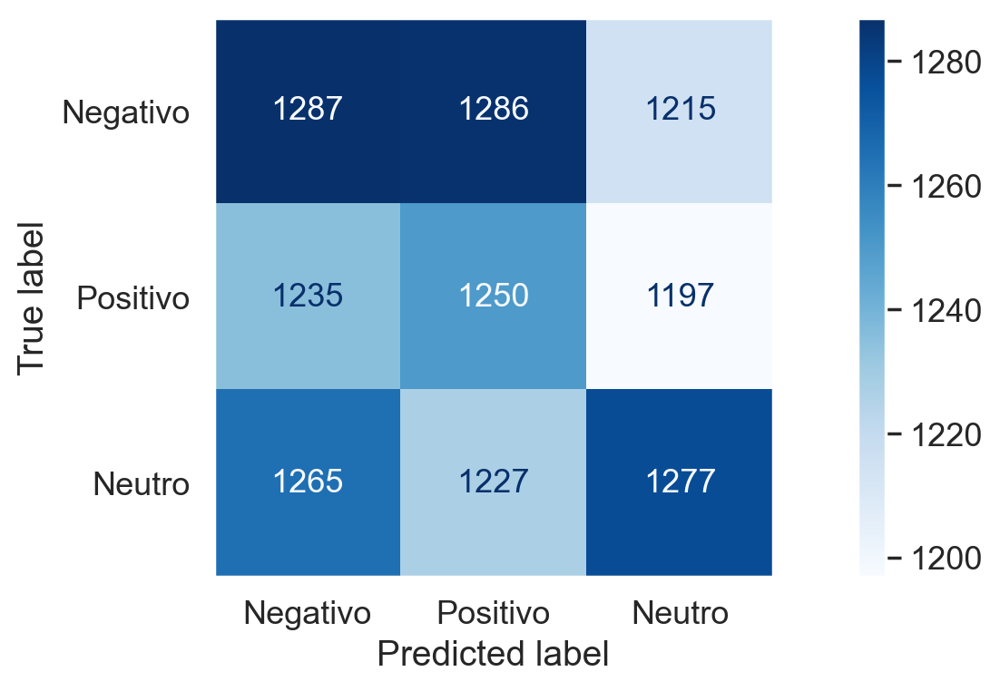

Partial time: 0:00:00.245130

Model      : Linear Support Vector Machine
Accuracy   : 0.6427 
Precision  : 0.6384 
Recall     : 0.6427 
F1 - Score : 0.6393 
MAE        : 0.4415 
RMSE       : 0.7809 
R2         : 0.0930 

              precision    recall  f1-score   support

           0       0.62      0.58      0.60      3788
           1       0.59      0.55      0.57      3682
           2       0.71      0.79      0.75      3769

    accuracy                           0.64     11239
   macro avg       0.64      0.64      0.64     11239
weighted avg       0.64      0.64      0.64     11239



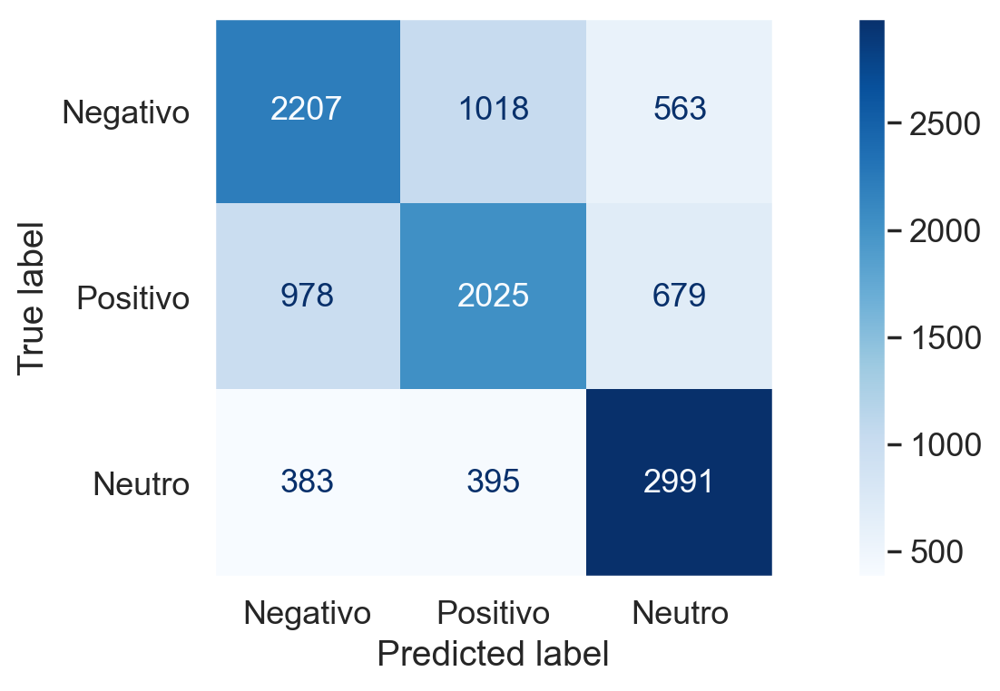

Partial time: 0:00:03.252778

Model      : Stochastic Gradient Descent Classifier
Accuracy   : 0.6453 
Precision  : 0.6454 
Recall     : 0.6453 
F1 - Score : 0.6451 
MAE        : 0.4346 
RMSE       : 0.7709 
R2         : 0.1160 

              precision    recall  f1-score   support

           0       0.60      0.63      0.61      3788
           1       0.58      0.56      0.57      3682
           2       0.75      0.75      0.75      3769

    accuracy                           0.65     11239
   macro avg       0.64      0.64      0.64     11239
weighted avg       0.65      0.65      0.65     11239



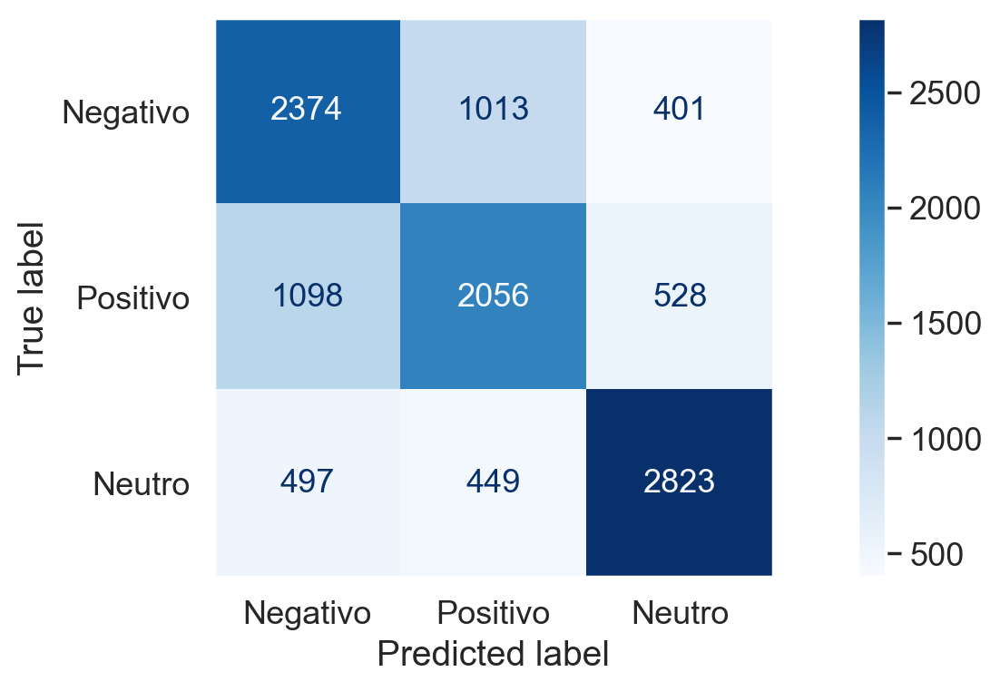

Partial time: 0:00:00.616426
[LightGBM] [Info] Total Bins 12750
[LightGBM] [Info] Number of data points in the train set: 26224, number of used features: 50
[LightGBM] [Info] Start training from score -1.115843
[LightGBM] [Info] Start training from score -1.098765
[LightGBM] [Info] Start training from score -1.081523

Model      : LightGBM
Accuracy   : 0.6948 
Precision  : 0.6940 
Recall     : 0.6948 
F1 - Score : 0.6943 
MAE        : 0.3542 
RMSE       : 0.6725 
R2         : 0.3274 

              precision    recall  f1-score   support

           0       0.64      0.66      0.65      3788
           1       0.61      0.59      0.60      3682
           2       0.83      0.84      0.83      3769

    accuracy                           0.69     11239
   macro avg       0.69      0.69      0.69     11239
weighted avg       0.69      0.69      0.69     11239



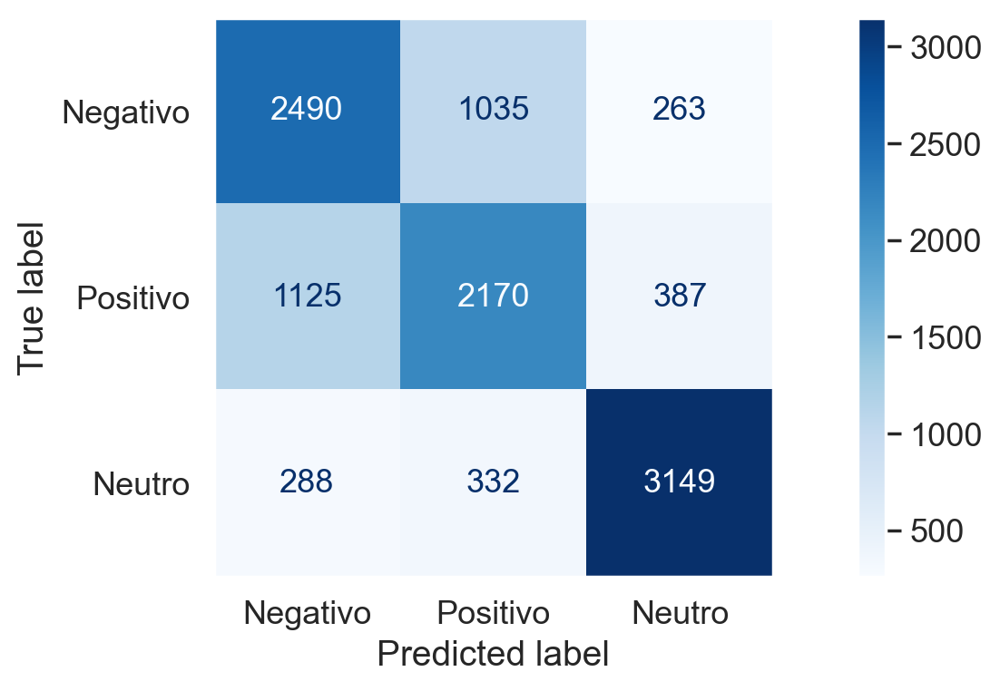

Partial time: 0:00:02.724268

Model      : Logistic Regression
Accuracy   : 0.6481 
Precision  : 0.6472 
Recall     : 0.6481 
F1 - Score : 0.6475 
MAE        : 0.4246 
RMSE       : 0.7550 
R2         : 0.1523 

              precision    recall  f1-score   support

           0       0.62      0.59      0.60      3788
           1       0.57      0.58      0.58      3682
           2       0.75      0.77      0.76      3769

    accuracy                           0.65     11239
   macro avg       0.65      0.65      0.65     11239
weighted avg       0.65      0.65      0.65     11239



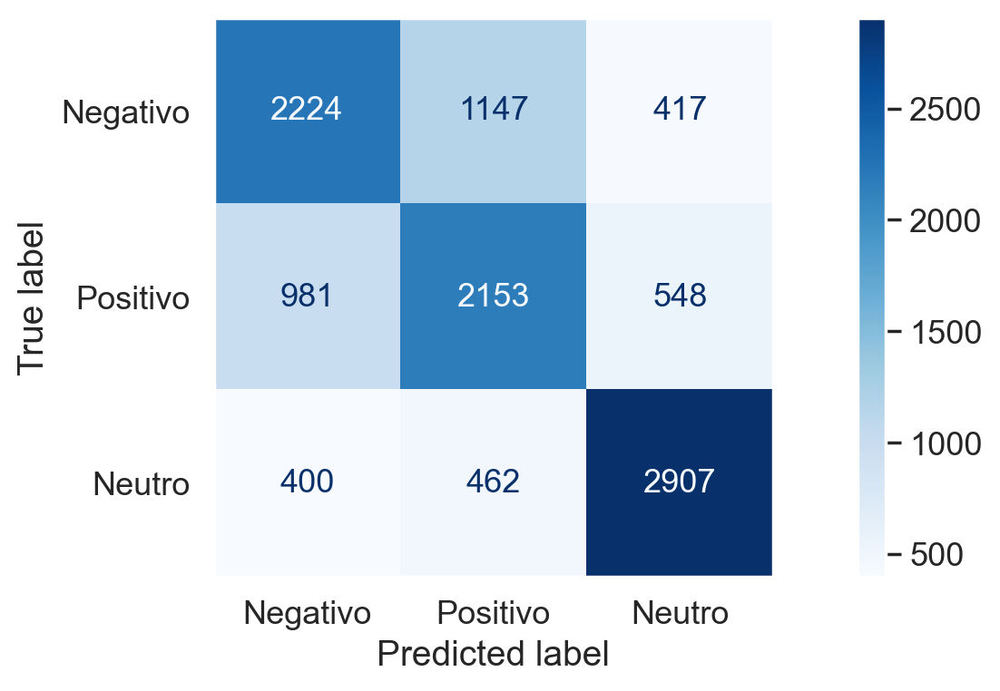

Partial time: 0:00:00.902703

Model      : Classifier Ridge regression
Accuracy   : 0.6415 
Precision  : 0.6370 
Recall     : 0.6415 
F1 - Score : 0.6372 
MAE        : 0.4471 
RMSE       : 0.7902 
R2         : 0.0715 

              precision    recall  f1-score   support

           0       0.62      0.58      0.60      3788
           1       0.60      0.54      0.57      3682
           2       0.69      0.80      0.74      3769

    accuracy                           0.64     11239
   macro avg       0.64      0.64      0.64     11239
weighted avg       0.64      0.64      0.64     11239



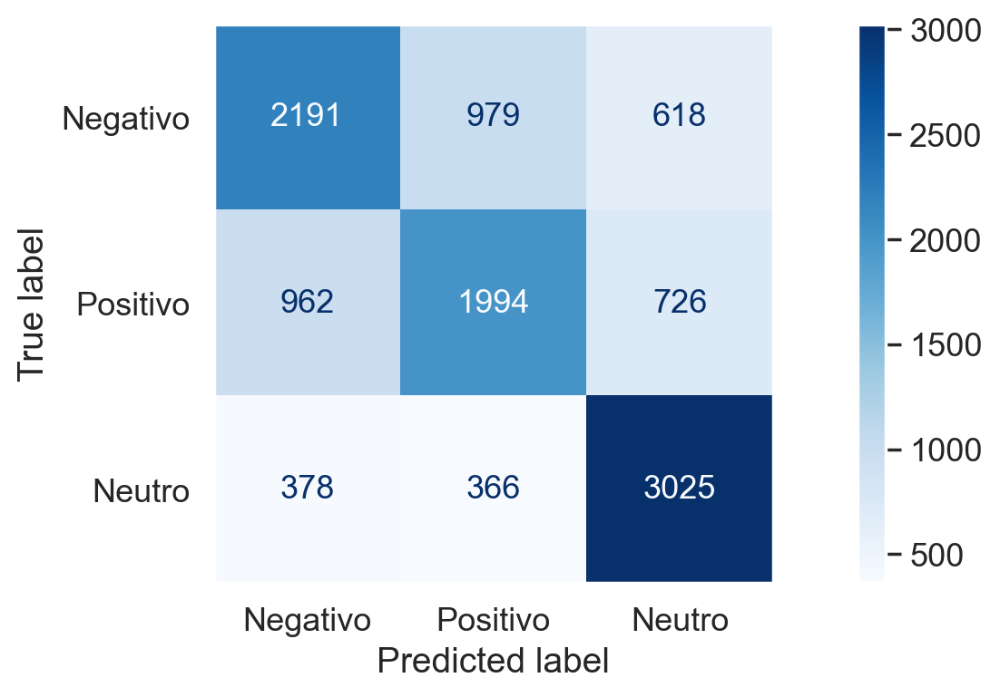

Partial time: 0:00:00.382849

Model      : Bernoulli Naive Bayes
Accuracy   : 0.5876 
Precision  : 0.5853 
Recall     : 0.5876 
F1 - Score : 0.5862 
MAE        : 0.5154 
RMSE       : 0.8494 
R2         : -0.0730 

              precision    recall  f1-score   support

           0       0.57      0.57      0.57      3788
           1       0.53      0.50      0.51      3682
           2       0.66      0.69      0.68      3769

    accuracy                           0.59     11239
   macro avg       0.58      0.59      0.59     11239
weighted avg       0.59      0.59      0.59     11239



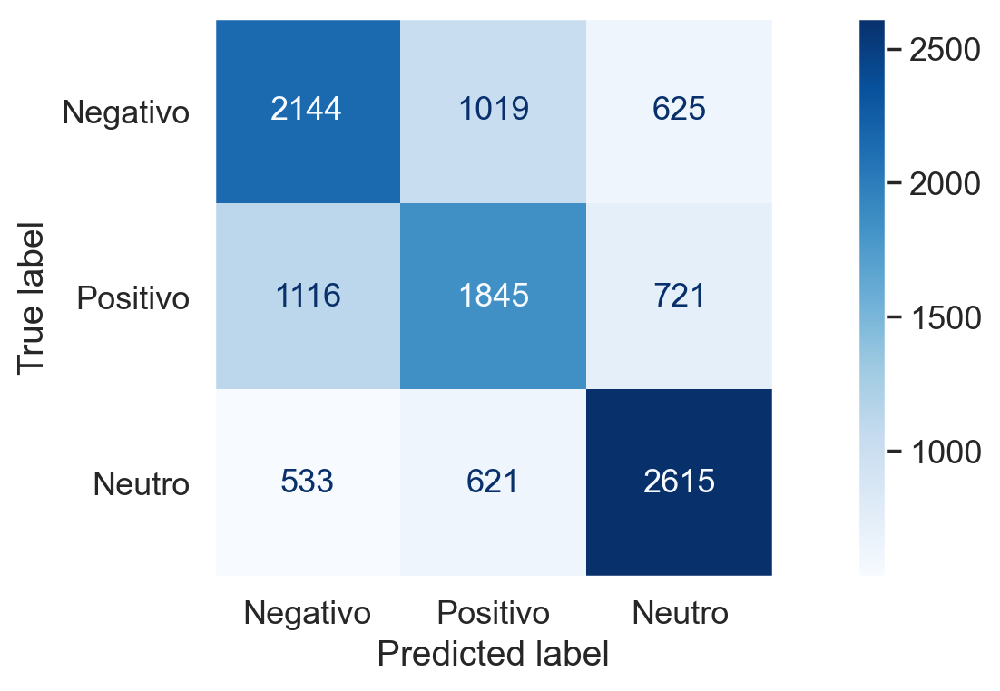

Partial time: 0:00:00.385160

Model      : Decision Tree
Accuracy   : 0.6841 
Precision  : 0.6835 
Recall     : 0.6841 
F1 - Score : 0.6838 
MAE        : 0.3700 
RMSE       : 0.6915 
R2         : 0.2889 

              precision    recall  f1-score   support

           0       0.63      0.64      0.64      3788
           1       0.60      0.59      0.60      3682
           2       0.82      0.82      0.82      3769

    accuracy                           0.68     11239
   macro avg       0.68      0.68      0.68     11239
weighted avg       0.68      0.68      0.68     11239



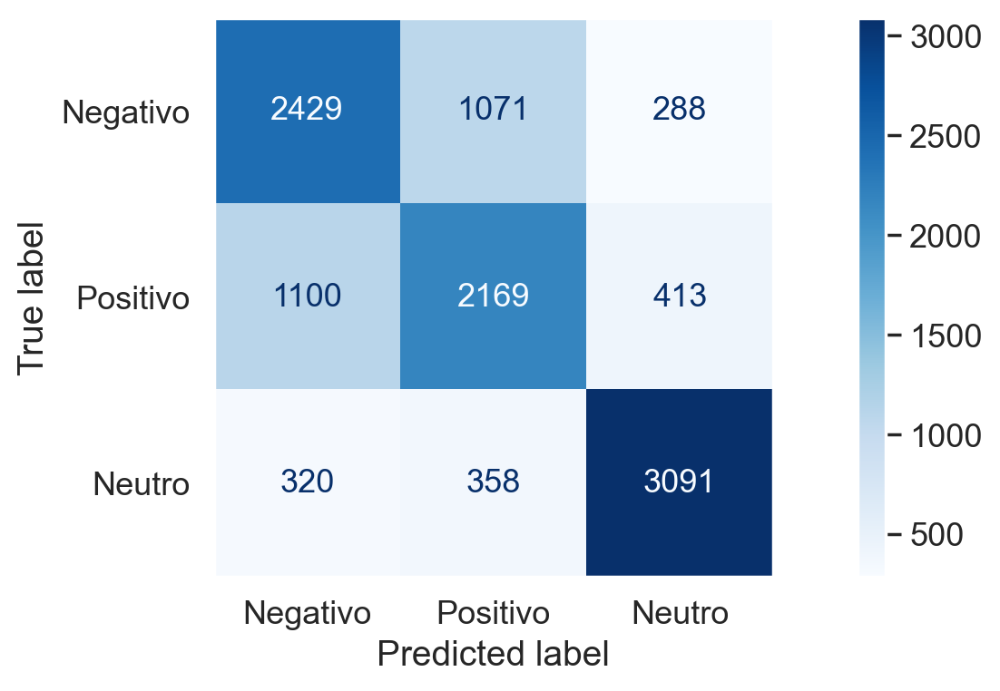

Partial time: 0:00:56.230976

Model      : AdaBoost
Accuracy   : 0.6215 
Precision  : 0.6212 
Recall     : 0.6215 
F1 - Score : 0.6208 
MAE        : 0.4558 
RMSE       : 0.7813 
R2         : 0.0921 

              precision    recall  f1-score   support

           0       0.57      0.61      0.59      3788
           1       0.54      0.50      0.52      3682
           2       0.75      0.75      0.75      3769

    accuracy                           0.62     11239
   macro avg       0.62      0.62      0.62     11239
weighted avg       0.62      0.62      0.62     11239



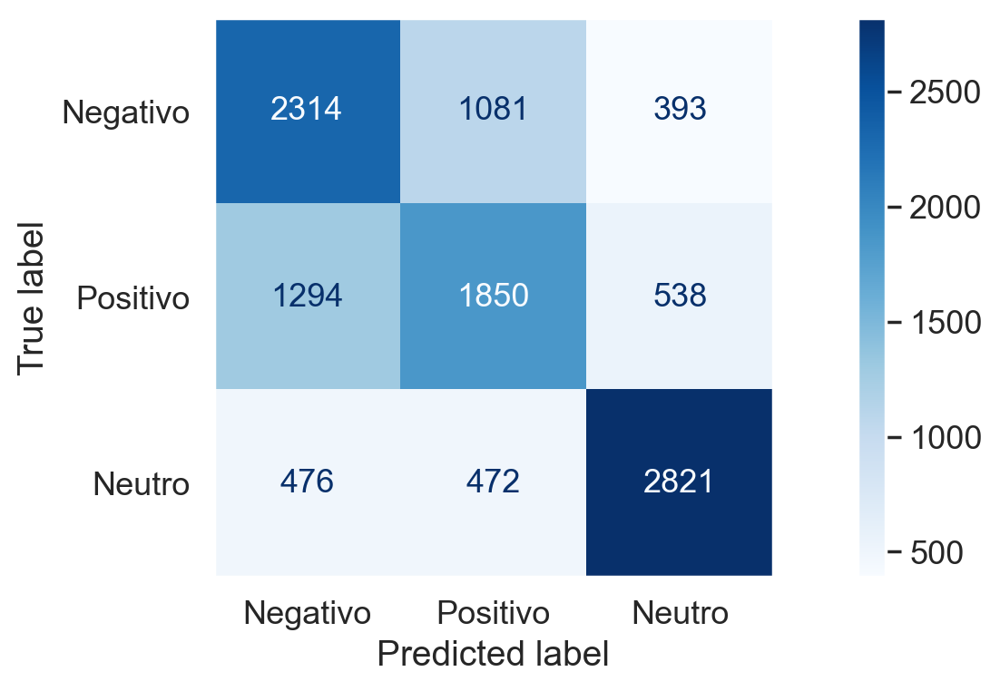

Partial time: 0:00:22.299971

Model      : XGBoost
Accuracy   : 0.7002 
Precision  : 0.7002 
Recall     : 0.7002 
F1 - Score : 0.7000 
MAE        : 0.3468 
RMSE       : 0.6639 
R2         : 0.3444 

              precision    recall  f1-score   support

           0       0.64      0.66      0.65      3788
           1       0.62      0.60      0.61      3682
           2       0.84      0.84      0.84      3769

    accuracy                           0.70     11239
   macro avg       0.70      0.70      0.70     11239
weighted avg       0.70      0.70      0.70     11239



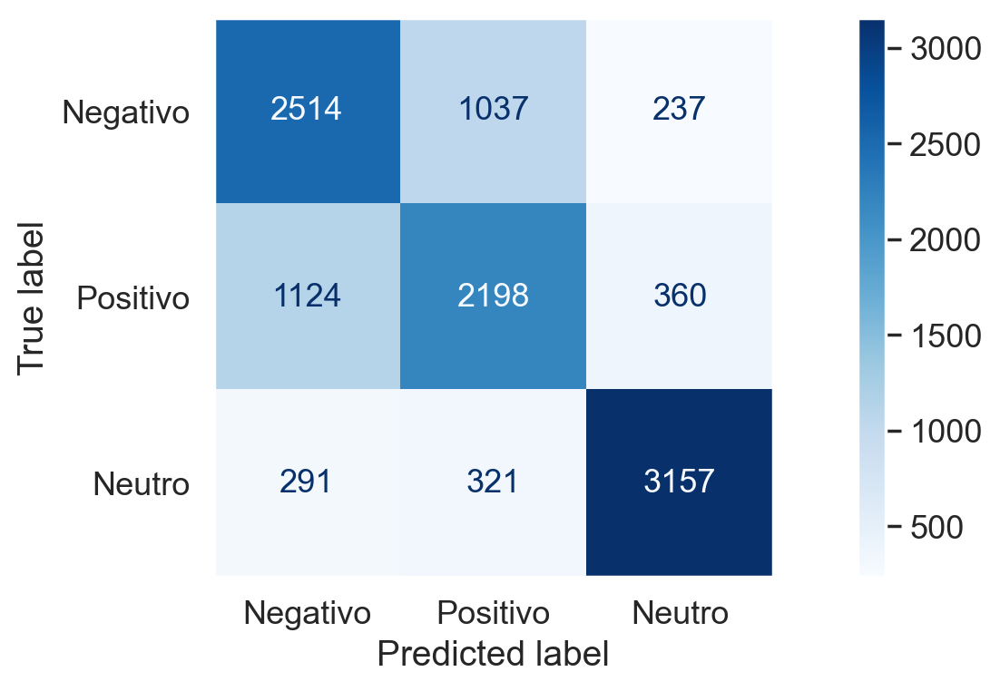

Partial time: 0:00:03.664429
CPU times: total: 1min 53s
Wall time: 1min 30s


In [88]:
%%time

# O processamento desta célula com o processamento dos modelos leva em média 9 minutos, em uma máquina i7 com 12 cores e 32 ram 

# Processando os modelos baseado na list_models

test_models (list_models,
             "model_name",
             "estimator",
             "Doc2Vec",
             X_train_d2v,
             X_test_d2v,
             y_train_d2v,
             y_test_d2v)


#### Avaliação dos modelos

In [90]:
# Conmparação das pontuações após técnicas de balanceamento
# Ordenando a pontuação
score.sort(key = lambda y:y[2],reverse =True)

# Exibindo a pontuação
dfscore = pd.DataFrame (score, columns = ['Modelo', 'Técnica', 'Acurácia'])

# Apresenta o modelo que obteve a melhor acurácia
print(f'O modelo {dfscore.iloc[0][0]} apresentou a melhor acurácia {dfscore.iloc[0][2]}.\n')
print("Comparação da Acurácia dos modelos: ")
dfscore

O modelo Logistic Regression apresentou a melhor acurácia 0.7771154017261322.

Comparação da Acurácia dos modelos: 


,Modelo,Técnica,Acurácia
0,Logistic Regression,TF-IDF,0.777115
1,Stochastic Gradient Descent Classifier,TF-IDF,0.776671
2,Linear Support Vector Machine,TF-IDF,0.771688
3,Logistic Regression,CountVectorizer,0.771421
4,Classifier Ridge regression,TF-IDF,0.769997
5,Stochastic Gradient Descent Classifier,CountVectorizer,0.766883
6,Linear Support Vector Machine,CountVectorizer,0.758697
7,Bernoulli Naive Bayes,CountVectorizer,0.754071
8,Bernoulli Naive Bayes,TF-IDF,0.754071
9,Decision Tree,TF-IDF,0.751223


--- 

**Conclusões**

Os modelos listados para avaliação foram escolhidos pelo critério de tempo de processamento, menos de 10 minutos e acurácia para uma amostra de 40% do dataframe. 

A lista pode ser acrescida de outros modelos, porém o tempo de processamento do notebook pode ser extremamente longo, exemplo GradientBoostingClassifier com tempo de processamento superior a 40 min e acurácia similar ao Stochastic Gradient Descent Classifier que executa em segundos.

Os modelos foram treinados com as amostras utilizando técnicas para conversão de texto de Bag of Words (BoW) ContVectorizer / TF-IDF e Doc2Vec.

Bag of Words, na prática, cria um vetor com cada uma das palavras do texto completo da base,  depois, calcula a frequência em que essas palavras ocorrem em uma data sentença, para entã   classificar/treinar o mode

tf-idf (Term Frequency–Inverse Document Frequency) é uma técnica importante incorporada em algoritmos como similaridade de cosseno, distância euclidiana, SVM… com objetivo de encontrar documentos semelhantes a uma determinada consulta de pesquisa

O doc2vec é um algoritmo não supervisionado utilizado para gerar vetores para frases, parágrafos ou documentos (Representações distribuídas de sentenças e documento).
o

O critério de avaliação levou em consideração apenas o maior resultado apresentado pela acurácia do modelo. 

Nos diversos testes 2 modelos apresentaram a melhor acurácia que foram **Logistic Regression** e **Stochastic Gradient Descent Classifier**.


#### Otimização do Modelo

##### Stochastic Gradient Descent Classifier

In [91]:
# Modelo que apresentou a melhor acurácia

model = SGDClassifier(n_jobs=-1, max_iter=1000, random_state=random_seed)
 

###### Aplicando GridSearchCV

In [92]:
%%time

# Definindo valores iniciais para ajuste de parametro de reforço

# LogisticRegression
# param_gs = {'C': [1, 10, 100], 'penalty': ['l2'], 'max_iter': list(range(100,300,100))}

# SGDClassifier
param_gs = {'alpha': [0.0001, 0.001, 0.01, 0.1], 'penalty': ['l2'], "loss" : ["hinge", "log", "modified_huber"]}


# Instanciando GridSearchCV com a variação dos parametros 
gsearch = GridSearchCV(estimator=model, param_grid=param_gs, scoring='accuracy', refit=True, cv=3, verbose=2)

# Treinando o modelo com os conjuntos de dados
gsearch.fit(X_train_tfidf, y_train)

# Apresentação dos melhores parametros e melhor resultado
print('\nPrecisão média: %.5f' % gsearch.best_score_)
print('Configuração: %s' % gsearch.best_params_)


Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV] END ...............alpha=0.0001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ...............alpha=0.0001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ...............alpha=0.0001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END .................alpha=0.0001, loss=log, penalty=l2; total time=   0.0s
[CV] END .................alpha=0.0001, loss=log, penalty=l2; total time=   0.0s
[CV] END .................alpha=0.0001, loss=log, penalty=l2; total time=   0.0s
[CV] END ......alpha=0.0001, loss=modified_huber, penalty=l2; total time=   0.0s
[CV] END ......alpha=0.0001, loss=modified_huber, penalty=l2; total time=   0.0s
[CV] END ......alpha=0.0001, loss=modified_huber, penalty=l2; total time=   0.0s
[CV] END ................alpha=0.001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ................alpha=0.001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ................alpha=0.001, loss=hinge

##### Aplicando RandomizedSearchCV

In [93]:
%%time

# LogisticRegression
#param_rs = {'C': [1, 10, 100], 'penalty': ['l2'], 'max_iter': list(range(100,300,100))}

# SGDClassifier
param_rs = {'alpha': [0.0001, 0.001, 0.01, 0.1], 'penalty': ['l2'], "loss" : ["hinge", "log", "modified_huber"]}

# Instanciando RandomizedSearchCV com a variação dos parametros 
rsearch = RandomizedSearchCV(estimator=model, param_distributions=param_rs, scoring='accuracy', n_iter=100, cv=3, verbose=2)

# Treinando o modelo com os conjuntos de dados
rsearch.fit(X_train_tfidf, y_train)

# Apresentação dos melhores parametros e melhor resultado
print('\nPrecisão média: %.5f' % rsearch.best_score_)
print('Configuração: %s' % rsearch.best_params_)


Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV] END ...............alpha=0.0001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ...............alpha=0.0001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ...............alpha=0.0001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END .................alpha=0.0001, loss=log, penalty=l2; total time=   0.0s
[CV] END .................alpha=0.0001, loss=log, penalty=l2; total time=   0.0s
[CV] END .................alpha=0.0001, loss=log, penalty=l2; total time=   0.0s
[CV] END ......alpha=0.0001, loss=modified_huber, penalty=l2; total time=   0.0s
[CV] END ......alpha=0.0001, loss=modified_huber, penalty=l2; total time=   0.0s
[CV] END ......alpha=0.0001, loss=modified_huber, penalty=l2; total time=   0.0s
[CV] END ................alpha=0.001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ................alpha=0.001, loss=hinge, penalty=l2; total time=   0.0s
[CV] END ................alpha=0.001, loss=hinge

##### Logistic Regression

In [94]:
# Modelo que apresentou a melhor acurácia

model = LogisticRegression(random_state=random_seed)
 

###### Aplicando **GridSearchCV**

In [95]:
%%time

# Definindo valores iniciais para ajuste de parametro de reforço

# LogisticRegression
param_gs = {'C': [1, 10, 100], 'penalty': ['l2'], 'max_iter': list(range(100,300,100))}

# Instanciando GridSearchCV com a variação dos parametros 
gsearch = GridSearchCV(estimator=model, param_grid=param_gs, scoring='accuracy', refit=True, cv=3, verbose=2)

# Treinando o modelo com os conjuntos de dados
gsearch.fit(X_train_tfidf, y_train)

# Apresentação dos melhores parametros e melhor resultado
print('\nPrecisão média: %.5f' % gsearch.best_score_)
print('Configuração: %s' % gsearch.best_params_)


Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] END ......................C=1, max_iter=100, penalty=l2; total time=   1.3s
[CV] END ......................C=1, max_iter=100, penalty=l2; total time=   1.2s
[CV] END ......................C=1, max_iter=100, penalty=l2; total time=   1.3s
[CV] END ......................C=1, max_iter=200, penalty=l2; total time=   1.9s
[CV] END ......................C=1, max_iter=200, penalty=l2; total time=   1.9s
[CV] END ......................C=1, max_iter=200, penalty=l2; total time=   1.7s
[CV] END .....................C=10, max_iter=100, penalty=l2; total time=   1.7s
[CV] END .....................C=10, max_iter=100, penalty=l2; total time=   1.4s
[CV] END .....................C=10, max_iter=100, penalty=l2; total time=   1.5s
[CV] END .....................C=10, max_iter=200, penalty=l2; total time=   2.5s
[CV] END .....................C=10, max_iter=200, penalty=l2; total time=   2.8s
[CV] END .....................C=10, max_iter=200,

##### Aplicando RandomizedSearchCV

In [96]:
%%time

# LogisticRegression
param_rs = {'C': [1, 10, 100], 'penalty': ['l2'], 'max_iter': list(range(100,300,100))}

# Instanciando RandomizedSearchCV com a variação dos parametros 
rsearch = RandomizedSearchCV(estimator=model, param_distributions=param_rs, scoring='accuracy', n_iter=100, cv=3, verbose=2)

# Treinando o modelo com os conjuntos de dados
rsearch.fit(X_train_tfidf, y_train)

# Apresentação dos melhores parametros e melhor resultado
print('\nPrecisão média: %.5f' % rsearch.best_score_)
print('Configuração: %s' % rsearch.best_params_)


Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] END ......................C=1, max_iter=100, penalty=l2; total time=   1.3s
[CV] END ......................C=1, max_iter=100, penalty=l2; total time=   1.7s
[CV] END ......................C=1, max_iter=100, penalty=l2; total time=   1.3s
[CV] END ......................C=1, max_iter=200, penalty=l2; total time=   1.9s
[CV] END ......................C=1, max_iter=200, penalty=l2; total time=   2.1s
[CV] END ......................C=1, max_iter=200, penalty=l2; total time=   2.2s
[CV] END .....................C=10, max_iter=100, penalty=l2; total time=   1.6s
[CV] END .....................C=10, max_iter=100, penalty=l2; total time=   1.4s
[CV] END .....................C=10, max_iter=100, penalty=l2; total time=   1.7s
[CV] END .....................C=10, max_iter=200, penalty=l2; total time=   2.9s
[CV] END .....................C=10, max_iter=200, penalty=l2; total time=   3.2s
[CV] END .....................C=10, max_iter=200,

---

**Conclusões**

Após aplicar técnicas com alguns parametros para otimização o **GridSearchCV** e **RandomizedSearchCV** para o modelo Logistic Regression apresentaram o mesmo valor e não melhoraram a precisão do modelo.
Porém para o modelo Stochastic Gradient Descent Classifierque ficou em 2 lugar na acurácia teve uma leve melhora e superou o modelo Logistic Regression.

Existem diversas combinações de parametros para serem testados que podem melhorar a precisão do modelo, neste notebook abordei alguns parametros para  melhor e apresentar a utilização. 


#### Predição do arquivo de submissão

In [97]:
# O texto do arquivo (tweet_text) de submissão foi tratado com o mesmo processo do arquivo Train3Classes

# Quantidade de linhas e colunas

sqtl, sqtc = dfs.shape

print(f'Quantidade de linhas...........: {sqtl}')
print(f'Quantidade de colunas..........: {sqtc}')


Quantidade de linhas...........: 5000
Quantidade de colunas..........: 9


In [98]:
dfs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              5000 non-null   int64 
 1   tweet_text      5000 non-null   object
 2   tweet_date      5000 non-null   object
 3   query_used      5000 non-null   object
 4   filtered_words  5000 non-null   object
 5   join_f_words    4971 non-null   object
 6   num_words_text  5000 non-null   int8  
 7   num_words_join  5000 non-null   int8  
 8   diff_in_words   5000 non-null   int8  
dtypes: int64(1), int8(3), object(5)
memory usage: 249.2+ KB


In [99]:
# Listagem das primeiras linhas do dataframe

dfs[['tweet_text', 'filtered_words', 'join_f_words','num_words_text','num_words_join', 'diff_in_words']].head()


,tweet_text,filtered_words,join_f_words,num_words_text,num_words_join,diff_in_words
0,Apartamento Vila Mariana Praça Monteiro dos Santos O iMudou é especialista em imóveis e encontrou 7 oportunidades para a busca apartamento vila mariana praca monteiro dos santos. Temos as ofertas com o menor preço! :) https://t.co/8JlJ0N1Ewe,"['apartamento', 'vila', 'mariana', 'praça', 'monteiro', 'santos', 'mudar', 'especialista', 'imóveis', 'encontrar', 'oportunidades', 'buscar', 'apartamento', 'vila', 'mariana', 'praça', 'monteiro', 'santos', 'ofertas', 'menor', 'preço']",apartamento vila mariana praça monteiro santos mudar especialista imóveis encontrar oportunidades buscar apartamento vila mariana praça monteiro santos ofertas menor preço,36,21,15
1,@FalleNCS @BrasilGameShow quero 1x1 de scout. Dizem que dou muita bala cagada :),"['querer', 'scout', 'dizer', 'dou', 'muita', 'bala', 'cagar']",querer scout dizer dou muita bala cagar,13,7,6
2,mais uma analógica no correio à minha espera :D Só falta receber duas lentes e começar a revelar em casa.,"['analógica', 'correio', 'esperar', 'd', 'falta', 'receber', 'duas', 'lentes', 'começar', 'revelar', 'casa']",analógica correio esperar d falta receber duas lentes começar revelar casa,20,11,9
3,"Em festa de posse como presidente do STF, Toffoli canta Legião Urbana https://t.co/IEs709I35Z","['festa', 'posse', 'presidente', 'senar', 'relator', 'cantar', 'legião', 'urbana']",festa posse presidente senar relator cantar legião urbana,13,8,5
4,@thethiagor @jubsilva @GSCISA @GrupoMulheRIs A Flávia tem tuiter também @fmedeirosss :),"['flávia', 'twitter']",flávia twitter,11,2,9


**Pré-processamento e transformação**

In [100]:
# Avaliando os valores nulos do dataframe

missing_values_table(dfs)


O dataframe tem 9 colunas e 5000 linhas.
Existem 1 colunas que têm valores faltantes.


,Valores faltantes,% de Valores Totais,Data Type
join_f_words,29,0.6,object


In [101]:
# Retirando as linhas que ficaram sem texto

dfs = dfs[np.where((dfs['join_f_words'].str.len()>1), True, False)].copy()


In [102]:
# Exclusão dos registros faltantes 

dfs.dropna() 
dfs.reset_index(drop=True, inplace=True)

In [103]:
# Quantidade de linhas e colunas

sqtlc, sqtcc = dfs.shape

print('Dataframe original - dfs')
print(f'Quantidade de linhas...........: {sqtl}')
print(f'Quantidade de colunas..........: {sqtc}')

print('\nDataframe tratado - dfs')
print(f'Quantidade de linhas...........: {sqtlc}')
print(f'Quantidade de colunas..........: {sqtcc}')

print (f'\nPercentual de registros retirados: {(100  * (sqtl-sqtlc) / sqtl):.2f}%')


Dataframe original - dfs
Quantidade de linhas...........: 5000
Quantidade de colunas..........: 9

Dataframe tratado - dfs
Quantidade de linhas...........: 4969
Quantidade de colunas..........: 9

Percentual de registros retirados: 0.62%


---

**Conclusões**

O dataframe de submissão apresentou valores em branco depois que o texto foi tratado, como representam menos de 1% da amostra as linhas foram retiradas


**Processando os melhores modelos**

**Stochastic Gradient Descent Classifier**

In [105]:
%%time

# Definição do modelo
model = SGDClassifier(loss='modified_huber', n_jobs=-1, random_state=42)

# Treinando o modelo
model.fit(X_train_tfidf, y_train)

# Definição dos dados numa matriz X_subm que contém o texto do novo dataframe
X_subm = dfs['join_f_words']
X_subm_tfidf = tfidf.transform(X_subm)

# Predição de sentimentos do texo
y_predict_subm = model.predict(X_subm_tfidf)

# Cria a coluna de predição logistica
dfs["predict_SGDC"] = y_predict_subm

# Cria dataframe de resposta  
df_SGDC = dfs[['id', 'predict_SGDC']]
df_SGDC.rename(columns = {'predict_SGDC':'sentiment_predict'}, inplace = True)


CPU times: total: 2.38 s
Wall time: 241 ms


**Logistic Regression**

In [106]:
%%time

# Definição do modelo
model = LogisticRegression(random_state=random_seed)

# Treinando o modelo 
model.fit(X_train_tfidf, y_train)

# Definição dos dados numa matriz X_subm que contém o texto do novo dataframe
X_subm = dfs['join_f_words']
X_subm_tfidf = tfidf.transform(X_subm)

# Predição de sentimentos do texo
y_predict_subm = model.predict(X_subm_tfidf)

# Cria a coluna de predição logistica
dfs['predict_LR'] = y_predict_subm

# Cria dataframe de resposta  
df_LR = dfs[['id', 'predict_LR']]
df_LR.rename(columns = {'predict_LR':'sentiment_predict'}, inplace = True)


CPU times: total: 7.2 s
Wall time: 1.62 s


**Analisando a predição dos modelos**

In [107]:
# Criação de nova variável substituindo os valores "outros" por :|, ou seja, diferente de ":(" e ":)" para 
# agrupar os sentimentos neutros

conditions = [
    (dfs['query_used'] != ':(') & (dfs['query_used'] != ':)'),
    (dfs['query_used'] == ':('),
    (dfs['query_used'] == ':)')]
choices = [':|', ':(', ':)']
dfs['sent_query_used'] = np.select(conditions, choices, default=np.NaN)

# Analisando a quantidade de tweets baseado em query_used, pois na amostra de treino e teste esta variável definiu o 
# agrupamento da variável sentiment
temp_s = dfs.groupby('sent_query_used').count()['tweet_text'].reset_index().sort_values(by='tweet_text',ascending=False)
temp_s.rename(columns = {'tweet_text':'qtd_dfs'}, inplace = True)

In [108]:
# Distribuição de tweets agrupados pela predição do modelo Stochastic Gradient Descent Classifier
temp_sgdc = dfs.groupby('predict_SGDC').count()['tweet_text'].reset_index().sort_values(by='tweet_text',ascending=False)
temp_sgdc.rename(columns = {'tweet_text':'qtd_SGDC'}, inplace = True)

# Distribuição de tweets agrupados pela predição do modelo Logistic Regression
temp_lr = dfs.groupby('predict_LR').count()['tweet_text'].reset_index().sort_values(by='tweet_text',ascending=False)
temp_lr.rename(columns = {'tweet_text':'qtd_LR'}, inplace = True)

In [121]:
# Concatenando os dataframes auxiliares para avaliar a quantidade de sentimentos e query_used

dfs_pred = pd.concat([temp_s, temp_sgdc, temp_lr], axis=1)
dfs_pred[['sent_query_used', 'qtd_dfs', 'qtd_SGDC', 'qtd_LR']]


,sent_query_used,qtd_dfs,qtd_SGDC,qtd_LR
2,:|,1704,1766,1736
1,:),1648,1647,1704
0,:(,1617,1556,1529


In [122]:
# Calculando as diferenças entre as predições vs query_used variável para definir o sentimento

dfs_pred['dfs_SGDC'] = -1 *(dfs_pred['qtd_dfs'] - dfs_pred['qtd_SGDC'])
dfs_pred['dfs_LR'] = -1 *(dfs_pred['qtd_dfs'] - dfs_pred['qtd_LR'])
dfs_pred[['sent_query_used', 'qtd_dfs', 'qtd_SGDC', 'qtd_LR', 'dfs_SGDC', 'dfs_LR']]


,sent_query_used,qtd_dfs,qtd_SGDC,qtd_LR,dfs_SGDC,dfs_LR
2,:|,1704,1766,1736,62,32
1,:),1648,1647,1704,-1,56
0,:(,1617,1556,1529,-61,-88


--- 

**Conclusões**

Após processamento do modelo **Stochastic Gradient Descent Classifier** notamos que:

- para o sentimento neutro   (2), o modelo classificou 62 tweets a mais
- para o sentimento positivo (1), o modelo classificou 1 tweets a menos
- para o sentimento negativo (0), o modelo classificou 61 tweets a menos

<br>

Após processamento do modelo **Logistic Regression** notamos que:

- para o sentimento neutro   (2), o modelo classificou 32 tweets a mais
- para o sentimento positivo (1), o modelo classificou 56 tweets a mais
- para o sentimento negativo (0), o modelo classificou 88 tweets a menos


In [123]:
# Grava dataframe de resposta

# Definindo o nome do arquivo
file_name_LR = './dados/subm/johnny_horita_780_projeto_2_submissao_LR.csv'
file_name_SGDC = './dados/subm/johnny_horita_780_projeto_2_submissao_SGDC.csv'

# Salvando o CSV
try:
    # Gravando o dataframe em CSV   
    df_LR.to_csv(file_name_LR, index=False, sep=';', encoding='utf-8')
    df_SGDC.to_csv(file_name_SGDC, index=False, sep=';', encoding='utf-8')
    print(f'DataFrame gravado com successo.\n')
        
except:
    print("Ocorreu um erro na gravação.")


DataFrame gravado com successo.



## 5. Conclusões

No decorrer do notebook foram inseridas diversas células de conclusões após processos importantes, abaixo complemento de forma integrada e resumida o processo do projeto.

Em análise de consistência dos dados, efetuei carga dos arquivos Train3Classes.csv e Subm3Classes.csv e verifiquei as informações básicas dos arquivos, como quantidade de variáveis (colunas), valores duplicados e valores faltantes (nan). 

Em Pré-processamento e transformações, criei variáveis auxiliares para aplicar técnicas de normalização, stemming, tokenização, stopwords, retirada de caracteres especiais, e-mails e urls na variável **tweet_text**.
Tratei os dataframes com a exclusão de linhas duplicadas e colunas que não são necessárias para o modelo.

No processo de EAD (Análise exploratória de dados) analisei a quantidade de tweets por sentimentos e identifiquei que a amostra  esta balanceada com a quantiddade de sentimentos negativos, positivos e neutros.
Outro item interessante que a variável query_used foi utilizada para determinar um valor numérico para agrupar os sentimentos.
Analisei as palavras mais utilizadas nos tweets e as palavras mais utilizadas por sentimento com base nesses estudos gerei gráficos para facilitar a visualização e a nuvem de palavras. 

Em treinamento do modelo, devido a grande quantidade de registros e palavras utilizei uma amostra de 40% do dataframe (sample(frac=0.4), submeti a amostra de treino e teste com técnicas de **CountVectorizer**, **TfidfVectorizer** e **Doc2Vec** a diversos modelos para identificar a melhor acurácia, este foi o único critério de pontuação para determinar a escolha do modelo.
Nos diversos testes executados 2 (dois) modelos apresentaram a melhor acurácia que foram **Logistic Regression** e **Stochastic Gradient Descent Classifier**.<br>
Para otimizar o modelo foram utilizados o **GridSearchCV** e **RandomizedSearchCV**, porém não apresentaram melhoras significativas com os parametros utilizados.
